In [1]:
from sympy import *
import sympy as sy
import sympy.physics.mechanics as me
from numpy import *
import numpy as np
from IPython.display import display,Image,Math
import do_mpc
from casadi import *
import matplotlib.pyplot as plt
import control as ctrl
from tqdm import tqdm 
import seaborn as sns
from do_mpc.data import save_results, load_results
from matplotlib import cm
import pandas as pd
from scipy.interpolate import interp1d
import cantera as ct
import os

A equação diferencial ordinária não linear que relaciona a dinâmica da rotação do eixo de uma turbina em função da vazão mássica de combustível é descrita por:

$$\frac{dN}{dt} = \frac{1}{I} \left(\frac{\pi}{30}\right)^{-2} \left(\frac{\dot{W}_t - \dot{W}_c}{N}\right)$$



Nesse contexto, a ideia é isolar $\dot{N}$ e $N$ e fazer a linearização ao redor desses termos:

$f(\dot{N},N) = \dot{N} N$

Segundo Ogata, o método de linearização para uma função com duas variáveis consiste em resolver a seguinte equação:

$$f = \overline{f} - K_1(x_1 - \overline{x}_1) + K_2(x_2 - \overline{x}_2)$$

onde 

$\overline{f} = f(\overline{x}_1, \overline{x}_2)$

$K_1 = \frac{\partial f}{\partial x_1} \bigg|_{x_1 = \bar{x}_1, \, x_2 = \bar{x}_2}$

$K_2 = \frac{\partial f}{\partial x_2} \bigg|_{x_1 = \bar{x}_1, \, x_2 = \bar{x}_2}$

In [2]:
x,y,x_barra,y_barra,z,z_barra = sy.symbols('x y \\overline{x} \\overline{y} z \\overline{z}')
t = me.dynamicsymbols._t

## Resolvendo com variáveis auxiliares primeiro. 

No caso, a função a ser linearizada é do tipo:

$$ z = f(x,y) = x \cdot y$$

A ser linearizada nos pontos $\overline{x}$ e $\overline{y}$

In [3]:
lado_direito1 = x*y
lado_esquerdo1 = z
eq_aux = sy.Eq(lado_esquerdo1, lado_direito1)
eq_aux

Eq(z, x*y)

Encontrado $\overline{z}$:

In [4]:
dic_01 = {x:x_barra,y:y_barra}

In [5]:
lado_direito1_barra = lado_direito1.subs(dic_01)
eq_barra = sy.Eq(z_barra,lado_direito1_barra)
eq_barra

Eq(\overline{z}, \overline{x}*\overline{y})

Encontrando $K_1$:

In [6]:
k1 = lado_direito1.diff(x)
k1 = k1.subs(dic_01)
k1

\overline{y}

Encontrando $K_2$:

In [7]:
k2 = lado_direito1.diff(y)
k2 = k2.subs(dic_01)
k2

\overline{x}

Fazendo a formulação geral:

In [8]:
lado_direito2 = lado_direito1_barra + (k1 * (x - x_barra)) + (k2 * (y - y_barra))
lado_direito2 = lado_direito2.expand()
eq_aux_lin = sy.Eq(z,lado_direito2)
eq_aux_lin

Eq(z, -\overline{x}*\overline{y} + \overline{x}*y + \overline{y}*x)

A partir de agora, trabalharemos com as variáveis originais do problema, que são $N$ e $\dot{N}$

In [9]:
N,N_ponto,N_barra,N_ponto_barra = sy.symbols('N \\dot{N} \\overline{N} \\overline{\\dot{N}}')

In [10]:
dic_02 = {x:N,y:N_ponto,x_barra:N_barra,y_barra:N_ponto_barra}

In [11]:
lado_direito3 = lado_direito2.subs(dic_02)
eq_lin = sy.Eq(z,lado_direito3)
eq_lin

Eq(z, N*\overline{\dot{N}} + \dot{N}*\overline{N} - \overline{N}*\overline{\dot{N}})

Queremos que o eixo da turbina se mantenha com uma velocidade constante, dessa forma a aceleração angular é nula, ou seja $\overline{\dot{N}} = 0$

In [12]:
lado_direito3 = lado_direito3.subs(N_ponto_barra,0)
eq_lin_fin = sy.Eq(z,lado_direito3)
eq_lin_fin

Eq(z, \dot{N}*\overline{N})

Agora podemos voltar à primeira equação, agora com um modelo já linearizado.

In [13]:
Wt,Wc,I = sy.symbols('\\dot{W}_t \\dot{W}_c I')

In [14]:
lado_direito_edo = (1/I) * ((sy.pi/30)**-2) * (Wt - Wc)
lado_esquerdo_edo = lado_direito3
edo = sy.Eq(lado_esquerdo_edo, lado_direito_edo)
edo

Eq(\dot{N}*\overline{N}, 900*(-\dot{W}_c + \dot{W}_t)/(pi**2*I))

Podemos expandir $\dot{W}_c$ e $\dot{W}_t$ em:

$\dot{W}_t = \eta_{cc} \cdot \dot{m}_{comb} \cdot {PCI}$

onde:

* $ \eta_{cc}$ é a eficiência de combustão; 

* $ \dot{m}_{comb}$ é a vazão de combustível injetada na câmara de combustão; 

* $ {PCI}$ é o poder calorífico inferior do combustível.

$\dot{W}_c = \dot{m}_{ar} \cdot {c}_p \cdot (T_{sai} - T_{entra})$

onde:

* $ \dot{m}_{ar}$ é a vazão mássica de ar adimitada pelo compressor; 

* $ {c}_p $é o calor específico a pressão constante do fluido de trabalho, o ar;

* $T_{sai}$ é a temperatura de saída do compressor;

* $T_{entra}$ é a temperatura de entrada no compressor

Dessa forma, tem-se:

In [15]:
eta_cc,m_comb,PCI,m_ar,cp,T_sai,T_entra,K = sy.symbols('\\eta_cc \\dot{m}_{comb} PCI \\dot{m}_{ar} c_p T_{sai} T_{entra} k')

In [16]:
dic_03 = {Wt:eta_cc*m_comb*PCI, Wc:m_ar*cp*(T_sai-T_entra)}

In [17]:
lado_direito_edo = lado_direito_edo.subs(dic_03)
edo = sy.Eq(lado_esquerdo_edo, lado_direito_edo)
edo

Eq(\dot{N}*\overline{N}, 900*(PCI*\dot{m}_{comb}*\eta_cc - \dot{m}_{ar}*c_p*(-T_{entra} + T_{sai}))/(pi**2*I))

Ainda podemos escrever $m_{ar} = K \cdot N$, uma vez que o fluxo de ar se regula pela velocidade de rotação do eixo,logo.

In [18]:
dic_03 = {Wt:eta_cc*m_comb*PCI, Wc:m_ar*cp*(T_sai-T_entra), m_ar:K*N}

In [19]:
lado_direito_edo = lado_direito_edo.subs(dic_03)
edo = sy.Eq(lado_esquerdo_edo, lado_direito_edo)
edo = edo.simplify()
edo

Eq(\dot{N}*\overline{N}, 900*(N*c_p*k*(T_{entra} - T_{sai}) + PCI*\dot{m}_{comb}*\eta_cc)/(pi**2*I))

### Passando para o Espaço de Estados

Uma EDO pode ser representada no espaço de estados da seguinte forma:

$$\dot{x} = Ax + Bu$$
$$y = Cx + Du$$

onde:

* x é o vetor de estados do sistema, no caso N;
* u é a entrada do sistema, no caso a vazão mássica de combustível, $m_{comb}$;
* A é a matriz que relaciona os estados.
* B é a matriz que relaciona as entradas com os estados

Logo, para esse problema temos:

$$\dot{N} = AN + B\dot{m}_{comb}$$
$$N = CN 

In [20]:
edo_sol = sy.solve(edo, N_ponto)[0]
edo_sol = sy.Eq(N_ponto, edo_sol)
edo_sol

Eq(\dot{N}, 900*(N*T_{entra}*c_p*k - N*T_{sai}*c_p*k + PCI*\dot{m}_{comb}*\eta_cc)/(pi**2*I*\overline{N}))

Separando as matrizes:

Escrevendo a equação de A:

In [21]:
A,B,C,D = sy.symbols('A B C D')

In [22]:
A_dir =  900 * cp * K * (T_entra - T_sai)/ (sy.pi**2 * I * N_barra)
eq_A = sy.Eq(A,A_dir)
eq_A

Eq(A, 900*c_p*k*(T_{entra} - T_{sai})/(pi**2*I*\overline{N}))

Escrevendo a equação de B:

In [23]:
B_dir = (900 * PCI * eta_cc) / (sy.pi**2 * I * N_barra)
eq_B = sy.Eq(B,B_dir)
eq_B

Eq(B, 900*PCI*\eta_cc/(pi**2*I*\overline{N}))

In [24]:
C_dir = 1
eq_C = sy.Eq(C,1)
eq_C

Eq(C, 1)

In [25]:
D_dir = 0
eq_D =sy.Eq(D,D_dir)
eq_D

Eq(D, 0)

### Criando matriz de estado simbólica

In [26]:
A_matrix = sy.Matrix([[A_dir]])
B_matrix = sy.Matrix([[B_dir]])
C_matrix = sy.Matrix(([C_dir]))
D_matrix = sy.Matrix([[D_dir]])

In [27]:
display(Math(r'\dot{N} = ' + latex(A_matrix) + r' N + ' + latex(B_matrix) + r' ' + latex(m_comb)))

<IPython.core.display.Math object>

In [28]:
display(Math(r'\ddot{\theta} = ' + latex(A_matrix) + r' \dot{\theta} + ' + latex(B_matrix) + r' ' + latex(m_comb)))

<IPython.core.display.Math object>

## Impulso e Degrau

In [29]:
# Definindo os parametros do sistema
dic_sist = {
    sy.pi: np.pi,
    cp: 1004,
    K: 0.00002,
    T_entra: 298.15,
    T_sai: 373.482163,
    N_barra: 15000,
    PCI: 4.442e7,
    I: 0.063085,
    eta_cc: 0.98
}

A_num = A_dir.subs(dic_sist)
B_num = B_dir.subs(dic_sist)

print(f'A = {A_num}  e B = {B_num}')

A = -0.145770466459859  e B = 4194981.28351728


In [30]:
A_matrix_num = np.array([[0, 1],
                         [0, A_num]])

B_matrix_num = np.array([[0],
                         [B_num]])

C_matrix_num = np.array([[0,1]])

D_matrix_num = np.array([[0]])

sys = ctrl.ss(A_matrix_num, B_matrix_num, C_matrix_num, D_matrix_num)

# Resposta ao degrau
t_deg, y_deg = ctrl.step_response(sys)

# ========== ANÁLISE DE ESTABILIZAÇÃO ==========
def analise_estabilizacao(t, y):
    valor_final = y[-1]
    valor_maximo = np.max(y)
    tempo_maximo = t[np.argmax(y)]
    overshoot = ((valor_maximo - valor_final) / valor_final) * 100
    
    # Tempos de estabilização
    def obter_estabilizacao(porcentagem):
        tolerancia = abs(valor_final) * (porcentagem / 100)
        for i in range(len(y)-1, -1, -1):
            if abs(y[i] - valor_final) > tolerancia:
                return t[i+1] if i < len(t)-1 else t[i]
        return t[0]
    
    estabilizacao_2pct = obter_estabilizacao(2)

    
    return {
        'valor_final': valor_final,
        'valor_maximo': valor_maximo,
        'tempo_maximo': tempo_maximo,
        'overshoot_pct': overshoot,
        'estabilizacao_2pct': estabilizacao_2pct,
    }

# Executar análise
resultados = analise_estabilizacao(t_deg, y_deg)

# Criar DataFrame de resultados
df_resultados = pd.DataFrame({
    'Parâmetro': [
        'Valor Final',
        'Valor Máximo', 
        'Tempo do Máximo',
        'Overshoot (%)',
        'Estabilização',
    ],
    'Valor': [
        f"{resultados['valor_final']:.4f}",
        f"{resultados['valor_maximo']:.4f}",
        f"{resultados['tempo_maximo']:.4f}",
        f"{resultados['overshoot_pct']:.2f}",
        f"{resultados['estabilizacao_2pct']:.4f}",
    ]
})

print("=== ANÁLISE DE ESTABILIZAÇÃO ===")
print(df_resultados.to_string(index=False))
print(f"\n>> Sistema estabiliza em: {resultados['estabilizacao_2pct']:.3f} segundos (critério 2%)")

# Gráfico com marcações de estabilização
plt.figure(figsize=(12, 6), dpi=1200)
plt.plot(t_deg, y_deg, label="Resposta ao degrau")

# Adicionar marcações de estabilização
valor_final = resultados['valor_final']
plt.axhline(y=valor_final, color='k', linestyle='--', alpha=0.7, linewidth=1)
plt.axvline(x=resultados['estabilizacao_2pct'], color='green', linestyle='--', alpha=0.8, 
           linewidth=1.5, label=f"Estabilização: {resultados['estabilizacao_2pct']:.2f}s")

# Banda de tolerância 2%
plt.fill_between(t_deg, valor_final*0.98, valor_final*1.02, 
                alpha=0.2, color='orange')

# Marcar overshoot se existir
if resultados['overshoot_pct'] > 1:
    plt.plot(resultados['tempo_maximo'], resultados['valor_maximo'], 'ro', markersize=6)

plt.xlabel("Tempo (s)", fontsize=16)
plt.ylabel("Rotação (RPM)", fontsize=16)
plt.tick_params(axis='both', labelsize=14)
plt.gca().yaxis.get_offset_text().set_fontsize(14) 
plt.grid(True, linewidth=0.5)
plt.legend(fontsize=14)
plt.tight_layout()
plt.savefig("resposta_deg.png", format='png')
plt.show()

=== ANÁLISE DE ESTABILIZAÇÃO ===
      Parâmetro         Valor
    Valor Final 28777991.7661
   Valor Máximo 28777991.7661
Tempo do Máximo      236.9395
  Overshoot (%)          0.00
  Estabilização       27.4850

>> Sistema estabiliza em: 27.485 segundos (critério 2%)


In [31]:
# Resposta ao impulso
t_impulso, y_impulso = ctrl.impulse_response(sys)

# ========== ANÁLISE DE RESPOSTA AO IMPULSO ==========
def analise_impulso(t, y):
    valor_maximo = np.max(np.abs(y))  
    tempo_maximo = t[np.argmax(np.abs(y))]  
    valor_final = y[-1]
    
    # Para impulso, analisamos quando a resposta fica suficientemente pequena (critério de estabilização baseado em porcentagem do valor máximo)
    def obter_estabilizacao_impulso(porcentagem):
        tolerancia = valor_maximo * (porcentagem / 100)
        for i in range(len(y)-1, -1, -1):
            if abs(y[i]) > tolerancia:
                return t[i+1] if i < len(t)-1 else t[i]
        return t[0]
    
    estabilizacao_2pct = obter_estabilizacao_impulso(2) 

    
    
    return {
        'valor_maximo': valor_maximo,
        'tempo_maximo': tempo_maximo,
        'valor_final': valor_final,
        'estabilizacao_2pct': estabilizacao_2pct,
    }

# Executar análise
resultados = analise_impulso(t_impulso, y_impulso)

# Criar DataFrame de resultados
df_resultados = pd.DataFrame({
    'Parâmetro': [
        'Valor Máximo (abs)', 
        'Tempo do Máximo',
        'Valor Final',
        'Estabilização 2%',
    ],
    'Valor': [
        f"{resultados['valor_maximo']:.4f}",
        f"{resultados['tempo_maximo']:.4f}",
        f"{resultados['valor_final']:.4f}",
        f"{resultados['estabilizacao_2pct']:.4f}",
    ]
})

print("=== ANÁLISE DE RESPOSTA AO IMPULSO ===")
print(df_resultados.to_string(index=False))
print(f"\n>> Resposta ao impulso estabiliza em: {resultados['estabilizacao_2pct']:.3f} segundos (critério 2%)")

# Gráfico da resposta ao impulso com marcações
plt.figure(figsize=(12, 6), dpi=1200)
plt.plot(t_impulso, y_impulso, label="Resposta ao impulso", linewidth=2)

# Adicionar marcações importantes
valor_maximo = resultados['valor_maximo']
plt.axhline(y=0, color='k', linestyle='-', alpha=0.3, linewidth=0.8)
plt.axvline(x=resultados['estabilizacao_2pct'], color='green', linestyle='--', alpha=0.8, 
           linewidth=1.5, label=f"Estabilização 2%: {resultados['estabilizacao_2pct']:.2f}s")

# Banda de tolerância 2% do valor máximo
plt.fill_between(t_impulso, -valor_maximo*0.02, valor_maximo*0.02, 
                alpha=0.2, color='orange')

# Marcar pico máximo
plt.plot(resultados['tempo_maximo'], y_impulso[np.argmax(np.abs(y_impulso))], 
         'ro', markersize=6, label=f"Máximo: {valor_maximo:.3f}")

plt.xlabel("Tempo (s)", fontsize=16)
plt.ylabel("Rotação (RPM)", fontsize=16)
plt.tick_params(axis='both', labelsize=14)
plt.gca().yaxis.get_offset_text().set_fontsize(14) 
plt.grid(True, linewidth=0.5)
plt.legend(fontsize=14)
plt.tight_layout()
plt.savefig("resposta_impulso.png", format='png')
plt.show()

=== ANÁLISE DE RESPOSTA AO IMPULSO ===
         Parâmetro        Valor
Valor Máximo (abs) 4194981.2835
   Tempo do Máximo       0.0000
       Valor Final       0.0000
  Estabilização 2%      27.4850

>> Resposta ao impulso estabiliza em: 27.485 segundos (critério 2%)


* Descobrindo o valor da vazão de combustível que satisfaz a equação para o setpoint estabelecido

In [32]:
lh = N_ponto
rh = A*N + B*m_comb
eq_eqq = sy.Eq(lh, rh)
eq_eqq

Eq(\dot{N}, A*N + B*\dot{m}_{comb})

Mas como $\dot{N}$ = 0, temos:

In [33]:
eq_eqq = sy.Eq(0, rh)
sol_eqq = sy.solve(eq_eqq, m_comb)[0]
sol_eqq

-A*N/B

In [34]:
dic_eqq = {A:A_num, B:B_num, N:15000}
sol_eqq_num = sol_eqq.subs(dic_eqq)
print(f' A vazão mássica que estabiliza a rotação em 15000 RPM é {sol_eqq_num:.6} kg/s.')

 A vazão mássica que estabiliza a rotação em 15000 RPM é 0.000521232 kg/s.


### Criando o controlador MPC

In [35]:
def TG_mpc_model():
    """
    Função para modelar o controlador MPC para turbina a gás.
    """

    model_type = 'continuous'
    model = do_mpc.model.Model(model_type)

    # Declarando as variáveis de estado:
    theta = model.set_variable(var_type='_x', var_name='theta', shape=(1,1))    # Posição angular
    N = model.set_variable(var_type='_x', var_name='N', shape=(1,1))            # Velocidade angular
    
    # Variável de controle
    m_comb = model.set_variable(var_type='_u', var_name='m_comb', shape=(1,1))  # Vazão de combustível
    
    # Parâmetros físicos conhecidos
    pi = np.pi
    c_p = 1004          # Calor específico à pressão constante em [J/kg.K]
    k = 0.00002          # Coeficiente de fluxo de ar
    T_entra = 298.15       # Temperatura de entrada no compressor em [K]
    T_sai = 373.482163     # Temperatura de saída do compressor em[K]
    N_setpoint = 15000  # Rotação de operação do eixo em [RPM] 
    PCI = 4.442e7         # Poder Calorífico Inferior do combustível em [J/kg]
    I = 0.063085          # Momento de inércia do eixo que liga o a turbina ao compressor em [kg.m²]
    eta_cc = 0.98       # Eficência da combustão
    m_comb_ref = 0.000523826011072121   #vazão de combustível que satisfaz a rotação em 15000 rpm
    w = 0.5             # peso

    # Cálculo dos coeficientes dinâmicos
    A = (900 * c_p * k * (T_entra - T_sai))/ (pi**2 * I * N_setpoint)
    B = (900 * PCI * eta_cc) / (pi**2 * I * N_setpoint)

    # Equações de Estado
    model.set_rhs('theta', N)
    model.set_rhs('N', A*N + B*m_comb)

    model.setup()

    # Configurando o controlador MPC
    mpc = do_mpc.controller.MPC(model)
    setup_mpc = {
        'n_horizon': 50,     # Horizonte de predição 
        't_step': 0.2,       # Tempo entre cada atualização do controle
        'n_robust': 1,
        'store_full_solution': True,
    }
    mpc.set_param(**setup_mpc)

    # Função objetivo 
    mterm = (N - N_setpoint)**2 
    lterm = (N - N_setpoint)**2 + w * (m_comb - m_comb_ref)**2
    mpc.set_objective(mterm=mterm, lterm=lterm)

    mpc.set_rterm(m_comb=0.5)


    # Restrições com relação à injeção de combustível
    mpc.bounds['lower','_u','m_comb'] = 0.000416667
    mpc.bounds['upper','_u','m_comb'] = 0.002916667

    # Fator de Escala
    mpc.scaling['_x', 'N'] = 0.0000001

    mpc.setup()

    # Simulador e Estimador
    simulator = do_mpc.simulator.Simulator(model)
    simulator.set_param(t_step=0.2)
    simulator.setup()

    estimator = do_mpc.estimator.StateFeedback(model)

    # Estabelecendo condições iniciais
    x0 = np.array([0.0, 1000.0]) 
    mpc.x0 = x0
    simulator.x0 = x0
    estimator.x0 = x0

    # Palpite inicial
    mpc.set_initial_guess()

    return mpc, simulator, estimator   

In [36]:
def simular_turbina():
    """
    Simula e plota o comportamento da turbina para múltiplos valores de alpha.
    """
    alpha_list = sorted([0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8])
    n_steps = 50
    t_step = 0.2

    # Criando dicionário para armazenar dados
    N_history_dict = {}

    # Criando a figura
    fig_alphas, ax = plt.subplots(figsize=(12,6), dpi=1200)

    # Criando um vetor de tempo
    time_history = np.arange(0, n_steps * t_step + t_step, t_step)

    for alpha in alpha_list:
        # Reiniciando completamente o modelo para cada alpha
        mpc, simulator, estimator = TG_mpc_model()

        # Definindo as condições iniciais
        x0 = np.array([0.0, 1000.0])     # Condição inicial de theta e N
        u_prev = np.array([0.00042])        # Vazão de combustível inicial

        # Armazenar o ponto inicial
        N_history = [1000.0] 

        # Executando a simulação 
        for _ in range(n_steps):
            u0 = mpc.make_step(x0)
            u_suavizado = alpha * u0 + (1 - alpha) * u_prev
            u_prev = u_suavizado.copy()
            x0 = simulator.make_step(u_suavizado)
            x0 = estimator.make_step(x0)

            # Armazenando as rotações
            N_history.append(float(x0[1]))

        # Guardando os dados de rotação para cada alpha no dicionário
        N_history_dict[alpha] = N_history

    # Plotando os resultados
    for alpha in alpha_list:
        ax.plot(time_history, N_history_dict[alpha], label=f'α = {alpha}')

    # Configurações do gráfico
    ax.set_xlabel('Tempo (s)', fontsize=16)
    ax.set_ylabel('Rotação (RPM)', fontsize=16)
    ax.tick_params(axis='both', labelsize=14)

    # Banda de tolerância de ±2% em torno do setpoint (15000)
    setpoint = 15000
    tolerancia = 0.02 * setpoint
    inferior = setpoint - tolerancia
    superior = setpoint + tolerancia

    # Banda desenhada ao longo do tempo
    ax.fill_between(time_history, inferior, superior, alpha=0.2, color='#f5428a', label='±2% tolerância')

    
    # Adicionando linha de referência para o setpoint 
    ax.axhline(y=setpoint, color='black', linestyle='--', alpha=0.5, label='Setpoint')

        
    # Configurações da legenda 
    ax.legend(loc='lower right')
    ax.grid(True, linewidth=0.5)
    plt.tight_layout()
    plt.savefig("resposta_2D_suavizacao.png", format='png')
    plt.show()


    ### GRAFICO 3D ###

    # Criando meshgrid dos valores de alpha e tempo
    Alpha_mesh, Time_mesh = np.meshgrid(alpha_list, time_history)

    # Criando matriz de rotações (RPM) organizada para a superfície
    Rotation_matrix = np.array([N_history_dict[alpha] for alpha in alpha_list]).T  # Transposta para alinhar eixos

    fig = plt.figure(figsize=(12,6), dpi=350)
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(Time_mesh, Alpha_mesh, Rotation_matrix, antialiased = True, cmap=cm.coolwarm)

    # Configurando dos eixos
    ax.set_ylabel(r'Fator de suavização ($\alpha$)', fontsize=12, labelpad=10)
    ax.set_xlabel('Tempo (s)',fontsize=12, labelpad=10)
    ax.set_zlabel('Rotação (RPM)',fontsize=12, labelpad=10)
    #ax.set_title('Superfície 3D da Resposta da Turbina')
    fig.colorbar(surf, shrink=0.5, aspect=12, pad=0.1, label='Rotação (RPM)')
    plt.tight_layout()
    plt.savefig("superficie_3D_turbina.png", format='png')
    plt.show()
        
    return fig_alphas


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality c

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\1202741622.py:38: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_history.append(float(x0[1]))


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9902007e+08 7.31e+09 3.93e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

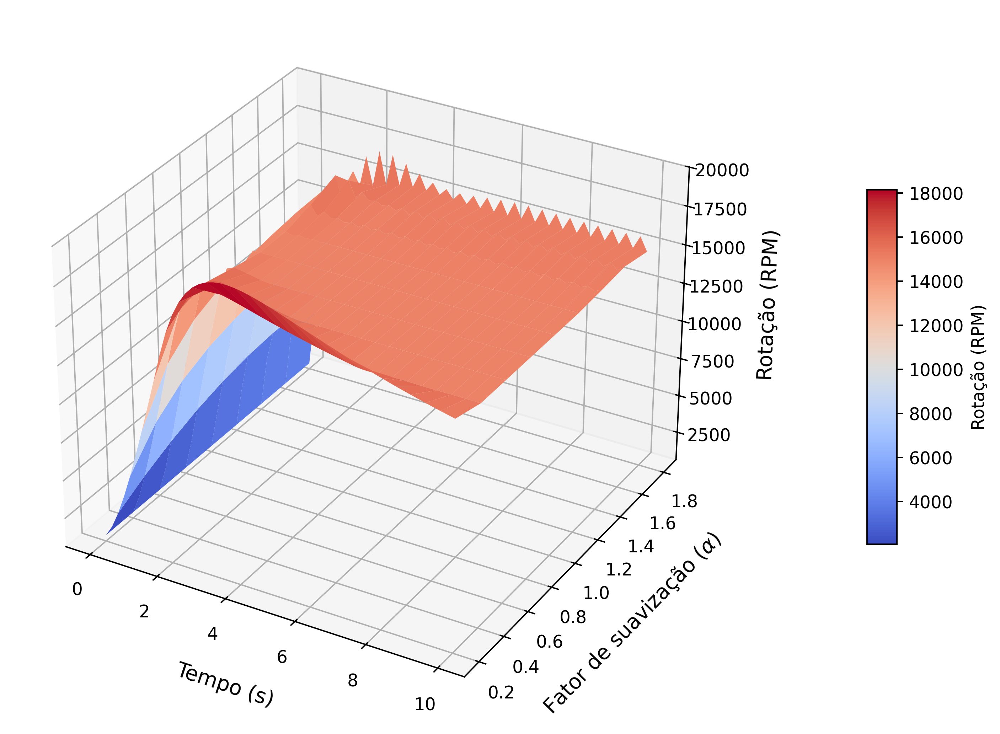

In [37]:
def main():
    simular_turbina()
    plt.show()

if __name__ == "__main__":
    main()

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2162809321.py:26: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2162809321.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


   2  4.9183478e+08 1.70e+10 4.21e+05  -1.0 1.70e+10  -4.5 1.46e-01 1.59e-03f  1
   3  4.9183407e+08 1.70e+10 2.65e+10  -1.0 1.70e+10  -5.0 1.00e+00 1.59e-05f  1
   4r 4.9183407e+08 1.70e+10 9.99e+02  10.2 0.00e+00  -5.4 0.00e+00 1.37e-07R  3
   5r 4.9183935e+08 1.79e+10 2.19e+08  10.2 2.00e+17    -  7.50e-06 3.95e-11f  1
   6r 4.5147450e+08 5.02e+10 2.00e+08   3.9 7.45e+12    -  3.45e-01 2.26e-03f  1
   7  4.5090136e+08 1.04e+10 1.04e+04  -1.0 1.07e+10  -5.9 1.00e+00 7.92e-01f  1
   8  4.5089915e+08 1.00e+10 1.80e+04  -1.0 2.21e+09  -6.4 1.00e+00 3.82e-02f  1
   9  4.5089913e+08 1.00e+10 4.84e+07  -1.0 2.13e+09  -6.9 1.00e+00 3.97e-04h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 4.5089913e+08 1.00e+10 9.99e+02   7.5 0.00e+00  -7.3 0.00e+00 2.51e-07R  5
  11r 4.5244741e+08 9.62e+09 1.15e+08   7.5 6.61e+16    -  3.10e-05 2.64e-08f  1
  12r 4.5329187e+08 1.03e+10 1.08e+08   3.3 1.28e+12    -  1.00e+00 1.03e-03f  1
  13  4.5329066e+08 1.02e+10

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2162809321.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


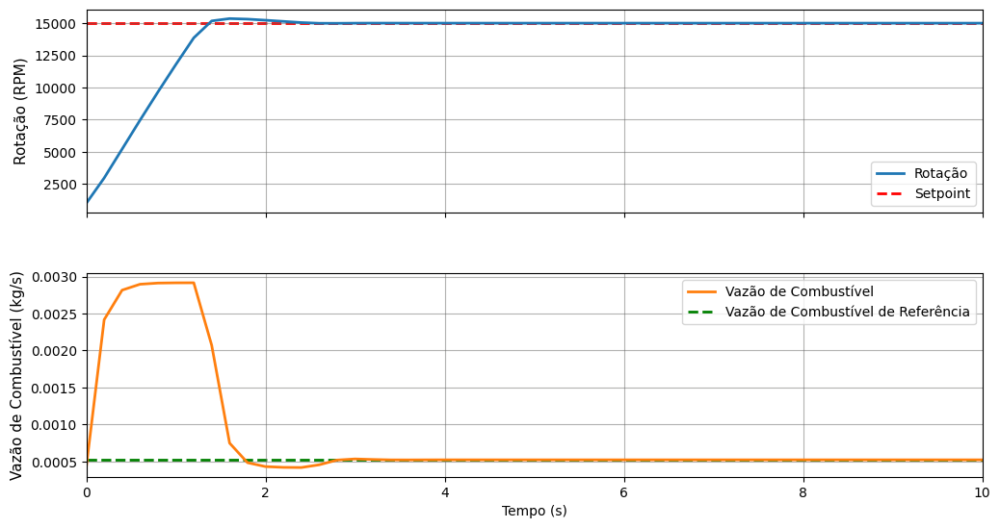

Simulação concluída!


In [38]:
def simular_turbina_unico_aplha():
    alpha = 0.80
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  
    u_prev = np.array([0.00042])  

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_080.xlsx', index=False)

    # === Plot ===
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(12, 6), 
                           gridspec_kw={'hspace': 0.3})

    # Grid e limites
    for a in ax:
        a.grid(True, alpha=0.5, linestyle='-', color='#666665')
        a.set_xlim(0, 10)

    # Rotação (RPM)
    ax[0].plot(time_array, N_array, label='Rotação', color='#1f77b4', linewidth=2)
    ax[0].axhline(15000, color='red', linestyle='--', linewidth=2, zorder=1, label='Setpoint')
    ax[0].set_ylabel('Rotação (RPM)', fontsize=11)
    ax[0].tick_params(labelsize=10)
    ax[0].legend(loc='lower right', fontsize=10)

    # Vazão de Combustível
    ax[1].plot(time_array, m_comb_array, label='Vazão de Combustível', color='#ff7f0e', linewidth=2)
    ax[1].axhline(0.0005238, color='green', linestyle='--', linewidth=2, zorder=1, label='Vazão de Combustível de Referência')
    ax[1].set_ylabel('Vazão de Combustível (kg/s)', fontsize=11)
    ax[1].set_xlabel('Tempo (s)', fontsize=10)
    ax[1].tick_params(labelsize=10)
    ax[1].legend(loc='upper right', fontsize=10)

    # Ajustes finais
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    fig.savefig('resposta_turbina_alphaesc.png', dpi=300, bbox_inches='tight')

    return fig, time_array, m_comb_array, N_array

def main():
    simular_turbina_unico_aplha()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [39]:
df = pd.read_excel('dados_turbina_080.xlsx')
print(df.head())  

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.002417    2970.128266
2        0.4                     0.002817    5213.962445
3        0.6                     0.002897    7459.386864
4        0.8                     0.002913    9653.505587


In [40]:
df_m_comb = df['Vazão de Combustível (kg/s)'].values
df_m_comb[-1]

0.0005212562387520126

In [41]:
# A vazão de ar é k * N
df['Vazão de Ar (kg/s)'] = df['Rotação (RPM)'] * 0.00002 
df.to_excel('dados_turbina_080.xlsx', index=False)

In [42]:
df_m_ar = df['Vazão de Ar (kg/s)'].values
df_m_ar[-1]

0.3000221617888042

In [43]:
print(pd.read_excel('dados_turbina_080.xlsx').head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Vazão de Ar (kg/s)
0        0.0                     0.000420    1000.000000            0.020000
1        0.2                     0.002417    2970.128266            0.059403
2        0.4                     0.002817    5213.962445            0.104279
3        0.6                     0.002897    7459.386864            0.149188
4        0.8                     0.002913    9653.505587            0.193070


### Validação numérica

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\125018669.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


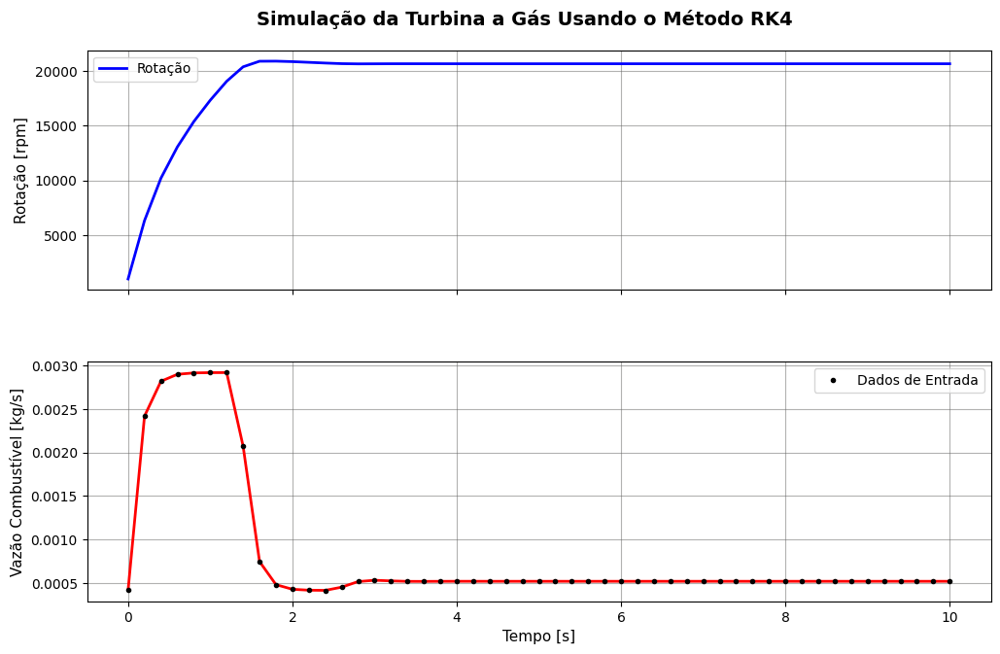


Simulação concluída! Os resultados foram salvos no arquivo: resultados_simulacaoRK4125.xlsx


In [44]:
def simular_turbina_rk4(arq_ent='dados_turbina_080.xlsx'):
    # Leitura e pré-processamento de dados do controlador
    dados_entrada = pd.read_excel(arq_ent)
    dados_entrada["Tempo (s)"] = dados_entrada["Tempo (s)"].astype(str).str.replace("[", "").str.replace("]", "").astype(float)
    
    # Remover linhas duplicadas baseadas na coluna de tempo
    dados_entrada = dados_entrada.drop_duplicates(subset=["Tempo (s)"])
    
    tempo = np.array(dados_entrada["Tempo (s)"], dtype=float)
    m_comb = np.array(dados_entrada['Vazão de Combustível (kg/s)'], dtype=float)
    m_ar = np.array(dados_entrada['Vazão de Ar (kg/s)'], dtype=float)
    N_simulador = np.array(dados_entrada['Rotação (RPM)'], dtype=float)

    # Removendo NaNs
    valid_indices = ~np.isnan(tempo) & ~np.isnan(m_comb) & ~np.isnan(m_ar)
    tempo = tempo[valid_indices]
    m_comb = m_comb[valid_indices]
    m_ar = m_ar[valid_indices]
    
    # Verificar se ainda existem valores duplicados
    if len(tempo) != len(np.unique(tempo)):
        # Se ainda existirem duplicatas, adicione um valor muito pequeno aos tempos duplicados
        tempo_ajustado = np.array(tempo)
        _, idx = np.unique(tempo, return_index=True)
        duplicates = np.ones(len(tempo), dtype=bool)
        duplicates[idx] = False
        
        # Adicionar um valor pequeno aos tempos duplicados
        epsilon = 1e-10
        for i in np.where(duplicates)[0]:
            tempo_ajustado[i] += epsilon * (i + 1)  # Incremento único para cada duplicata
        
        tempo = tempo_ajustado

    # Verificar se os arrays têm tamanho suficiente para interpolação cúbica
    if len(tempo) < 4:
        # Se houver menos de 4 pontos, usar interpolação linear
        kind = 'linear'
    else:
        kind = 'cubic'

    # Interpolação
    m_comb_interp = interp1d(tempo, m_comb, kind=kind, fill_value='extrapolate')
    m_ar_interp = interp1d(tempo, m_ar, kind=kind, fill_value='extrapolate')

    # Parâmetros da turbina
    I = 0.063085
    eta_cc = 0.98
    PCI = 4.442e7
    cp = 1004.0
    T_entrada = 298.15
    T_saida = 373.482163

    # Equação diferencial da rotação
    def dNdt(t, N):
        if N <= 0:
            return 0  # Evita divisão por zero
        m_comb_t = m_comb_interp(t)
        m_ar_t = m_ar_interp(t)
        W_t = eta_cc * m_comb_t * PCI
        W_c = m_ar_t * cp * (T_saida - T_entrada)
        return (1/I) * ((np.pi/30)**(-2)) * ((W_t - W_c) / N)

    # Condições iniciais
    N0 = N_simulador[0] if not np.isnan(N_simulador[0]) else 1000.0  # Valor padrão se for NaN
    t0 = tempo[0]
    tf = tempo[-1]
    h = 0.2
    n_steps = int((tf - t0) / h) + 1

    # Inicialização dos vetores
    T = np.zeros(n_steps)
    N = np.zeros(n_steps)
    m_comb_hist = np.zeros(n_steps)
    m_ar_hist = np.zeros(n_steps)

    # Valores iniciais
    T[0] = t0
    N[0] = N0
    m_comb_hist[0] = m_comb_interp(t0)
    m_ar_hist[0] = m_ar_interp(t0)

    # Método de Runge-Kutta 4ª ordem
    for i in range(1, n_steps):
        t = T[i-1]
        n = max(N[i-1], 1e-5)  # Evita N = 0
        
        k1 = dNdt(t, n)
        k2 = dNdt(t + h/2, n + h*k1/2)
        k3 = dNdt(t + h/2, n + h*k2/2)
        k4 = dNdt(t + h, n + h*k3)

        T[i] = t + h
        N[i] = n + (h/6) * (k1 + 2*k2 + 2*k3 + k4)
        m_comb_hist[i] = m_comb_interp(T[i])
        m_ar_hist[i] = m_ar_interp(T[i])

    # Plotando os gráficos
    fig, ax = plt.subplots(2, 1, figsize=(12, 7), sharex=True, 
                           gridspec_kw={'hspace': 0.3})
    fig.suptitle('Simulação da Turbina a Gás Usando o Método RK4', 
                 y=0.98, fontsize=14, fontweight='bold')

    for a in ax:
        a.grid(True, alpha=0.5, linestyle='-', color='#666665')
    
    # Plot da Rotação
    ax[0].plot(T, N, 'b-', linewidth=2, label='Rotação')
    ax[0].set_ylabel('Rotação [rpm]', fontsize=11)
    ax[0].legend(loc='best', fontsize=10)
    
    # Plot da vazão de combustível
    ax[1].plot(T, m_comb_hist, 'r-', linewidth=2)
    ax[1].plot(tempo, m_comb, 'ko', markersize=3, label='Dados de Entrada')
    ax[1].set_ylabel('Vazão Combustível [kg/s]', fontsize=11)
    ax[1].legend(loc='best', fontsize=10)
    

    ax[-1].set_xlabel('Tempo [s]', fontsize=11)  # Adiciona label apenas no último subplot
    
    for a in ax:
        a.tick_params(labelsize=10)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

    # Criando DataFrame dos resultados
    df_resultado = pd.DataFrame({
        'Tempo (s)': T,
        'Rotação (RPM)': N,
        'Vazão de Combustível (kg/s)': m_comb_hist,
        'Vazão de Ar (kg/s)': m_ar_hist,
    })
    df_resultado.to_excel('resultados_simulacaoRK4080.xlsx', index=False)

    return T, N, m_ar_hist, m_comb_hist

if __name__ == "__main__":
    simular_turbina_rk4()
    print("\nSimulação concluída! Os resultados foram salvos no arquivo: resultados_simulacaoRK4125.xlsx")

### Comparando os métodos

In [45]:
# Carregando dados do controlador MPC
df_simulador = pd.read_excel('dados_turbina_080.xlsx')
df["Tempo (s)"] = df["Tempo (s)"].astype(str).str.replace("[", "").str.replace("]", "").astype(float)
tempo_sim = df["Tempo (s)"].values
N_sim = df_simulador['Rotação (RPM)'].values
print(pd.read_excel("dados_turbina_080.xlsx").tail())

    Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Vazão de Ar (kg/s)
46        9.2                     0.000521   15001.149067            0.300023
47        9.4                     0.000521   15001.141207            0.300023
48        9.6                     0.000521   15001.131548            0.300023
49        9.8                     0.000521   15001.119931            0.300022
50       10.0                     0.000521   15001.108089            0.300022


In [46]:
# Calculando parâmetros para análise
N_st = 15000

# Máximo valor de resposta
N_max = np.max(N_sim)

# Overshoot
overshoot_abs = N_max - N_st
overshoot_pct = (overshoot_abs / N_st) * 100

# Valor de estabilização(média entre os 5 valores)
media = np.mean(N_sim[-5:])

print(f"Máximo sobressinal absoluto: {N_max:.2f} RPM")
print(f"Sobressinal percentual: {overshoot_pct:.2f}%")
print(f"Média dos últimos 5 valores: {media:.2f} RPM")

Máximo sobressinal absoluto: 15356.87 RPM
Sobressinal percentual: 2.38%
Média dos últimos 5 valores: 15001.13 RPM


In [47]:
# Carregar os resultados da simulação RK4
df_rk4_080 = pd.read_excel("resultados_simulacaoRK4080.xlsx")
tempo_rk4_080 = df_rk4_080["Tempo (s)"].values
N_rk4_080 = df_rk4_080["Rotação (RPM)"].values
print(pd.read_excel("resultados_simulacaoRK4080.xlsx").tail())

    Tempo (s)  Rotação (RPM)  Vazão de Combustível (kg/s)  Vazão de Ar (kg/s)
46        9.2   20658.774097                     0.000521            0.300023
47        9.4   20658.766937                     0.000521            0.300023
48        9.6   20658.760826                     0.000521            0.300023
49        9.8   20658.753135                     0.000521            0.300022
50       10.0   20658.744611                     0.000521            0.300022


In [48]:
# Máximo valor de resposta
N_max_rk4_080 = np.max(N_rk4_080)

# Overshoot
overshoot_abs_rk4_080 = N_max_rk4_080 - N_st
overshoot_pct_rk4_080 = (overshoot_abs_rk4_080 / N_st) * 100

# Valor de estabilização(média entre os 5 valores)
media_rk4_080 = np.mean(N_rk4_080[-5:])

# Diferença entre a estabilização
diff_abs_080 = media_rk4_080 - media
diff_pct_080 = (diff_abs_080 / media) * 100

print(f"Máximo sobressinal absoluto: {N_max_rk4_080:.2f} RPM")
print(f"Sobressinal percentual: {overshoot_pct_rk4_080:.2f}%")
print(f"Média dos últimos 5 valores: {media_rk4_080:.2f} RPM")
print(f"Diferença entre os sinais: {diff_abs_080:.2f} RPM")
print(f"Diferença em porcentual {diff_pct_080:.2f} %.")

Máximo sobressinal absoluto: 20897.49 RPM
Sobressinal percentual: 39.32%
Média dos últimos 5 valores: 20658.76 RPM
Diferença entre os sinais: 5657.63 RPM
Diferença em porcentual 37.71 %.


In [49]:
df_rk4_120 = pd.read_excel('resultados_simulacaoRK4120.xlsx')
tempo_rk4_120 = df_rk4_120["Tempo (s)"].values
N_rk4_120 = df_rk4_120['Rotação (RPM)'].values
print(pd.read_excel("resultados_simulacaoRK4120.xlsx").tail())

    Tempo (s)  Rotação (RPM)  Vazão de Combustível (kg/s)  Vazão de Ar (kg/s)
46        9.2   20121.975924                     0.000524            0.300003
47        9.4   20111.647202                     0.000524            0.300003
48        9.6   20101.312764                     0.000524            0.300003
49        9.8   20090.972214                     0.000524            0.300003
50       10.0   20080.627518                     0.000524            0.300003


In [50]:
# Máximo valor de resposta
N_max_rk4_120 = np.max(N_rk4_120)

# Overshoot
overshoot_abs_rk4_120 = N_max_rk4_120 - N_st
overshoot_pct_rk4_120 = (overshoot_abs_rk4_120 / N_st) * 100

# Valor de estabilização(média entre os 5 valores)
media_rk4_120 = np.mean(N_rk4_120[-5:])

# Diferença entre a estabilização
diff_abs_120 = media_rk4_120 - media
diff_pct_120 = (diff_abs_120 / media) * 100

print(f"Máximo sobressinal absoluto: {N_max_rk4_120:.2f} RPM")
print(f"Sobressinal percentual: {overshoot_pct_rk4_120:.2f}%")
print(f"Média dos últimos 5 valores: {media_rk4_120:.2f} RPM")
print(f"Diferença entre os sinais: {diff_abs_120:.2f} RPM")
print(f"Diferença em porcentual {diff_pct_120:.2f} %.")

Máximo sobressinal absoluto: 20496.27 RPM
Sobressinal percentual: 36.64%
Média dos últimos 5 valores: 20101.31 RPM
Diferença entre os sinais: 5100.18 RPM
Diferença em porcentual 34.00 %.


In [51]:
df_rk4_060 = pd.read_excel("resultados_simulacaoRK4060.xlsx")
tempo_rk4_060 = df_rk4_060["Tempo (s)"].values
N_rk4_060 = df_rk4_060["Rotação (RPM)"].values
print(pd.read_excel("resultados_simulacaoRK4060.xlsx").tail())

    Tempo (s)  Rotação (RPM)  Vazão de Combustível (kg/s)  Vazão de Ar (kg/s)
46        9.2   19821.362933                     0.000524            0.300031
47        9.4   19810.863704                     0.000524            0.300030
48        9.6   19800.344886                     0.000524            0.300029
49        9.8   19789.812150                     0.000524            0.300028
50       10.0   19779.273223                     0.000524            0.300027


In [52]:
# Máximo valor de resposta
N_max_rk4_060 = np.max(N_rk4_060)

# Overshoot
overshoot_abs_rk4_060 = N_max_rk4_060 - N_st
overshoot_pct_rk4_060 = (overshoot_abs_rk4_060 / N_st) * 100

# Valor de estabilização(média entre os 5 valores)
media_rk4_060 = np.mean(N_rk4_060[-5:])

# Diferença entre a estabilização
diff_abs_060 = media_rk4_060 - media
diff_pct_060 = (diff_abs_060 / media) * 100

print(f"Máximo sobressinal absoluto: {N_max_rk4_060:.2f} RPM")
print(f"Sobressinal percentual: {overshoot_pct_rk4_060:.2f}%")
print(f"Média dos últimos 5 valores: {media_rk4_060:.2f} RPM")
print(f"Diferença entre os sinais: {diff_abs_060:.2f} RPM")
print(f"Diferença em porcentual {diff_pct_060:.2f} %.")

Máximo sobressinal absoluto: 20913.62 RPM
Sobressinal percentual: 39.42%
Média dos últimos 5 valores: 19800.33 RPM
Diferença entre os sinais: 4799.20 RPM
Diferença em porcentual 31.99 %.


In [53]:
plt.figure(figsize=(12, 6), dpi=1200)

# Plotar dados do MPC
plt.plot(tempo_sim, N_sim, 'r', label=r"Curva de referência gerada pelo controlador MPC para $\alpha$ = 0.80")
plt.plot(tempo_rk4_080, N_rk4_080, label=r"Curva do método RK4 para $\alpha$ = 0.80")
plt.plot(tempo_rk4_120, N_rk4_120, label=r"Curva do método RK4 para $\alpha$ = 1.20")
plt.plot(tempo_rk4_060, N_rk4_060, label=r"Curva do método RK4 para $\alpha$ = 0.60")
plt.gca().yaxis.get_offset_text().set_fontsize(14) 
plt.tick_params(axis='both', labelsize=14)
plt.xlabel("Tempo (s)", fontsize=16)
plt.ylabel("Rotação (RPM)", fontsize=16)
plt.legend()
plt.grid(True)
plt.savefig('comparacao_curvas.png', format='png')
plt.show()

### Fechando a malha entre o controlador MPC e o RK4

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2908776672.py:74: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N[i] = runge_kutta_step(N[i-1], u_suavizado, t, h)
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2908776672.py:78: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_hist[i] = u_suavizado


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9902007e+08 7.32e+10 3.93e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2908776672.py:96: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


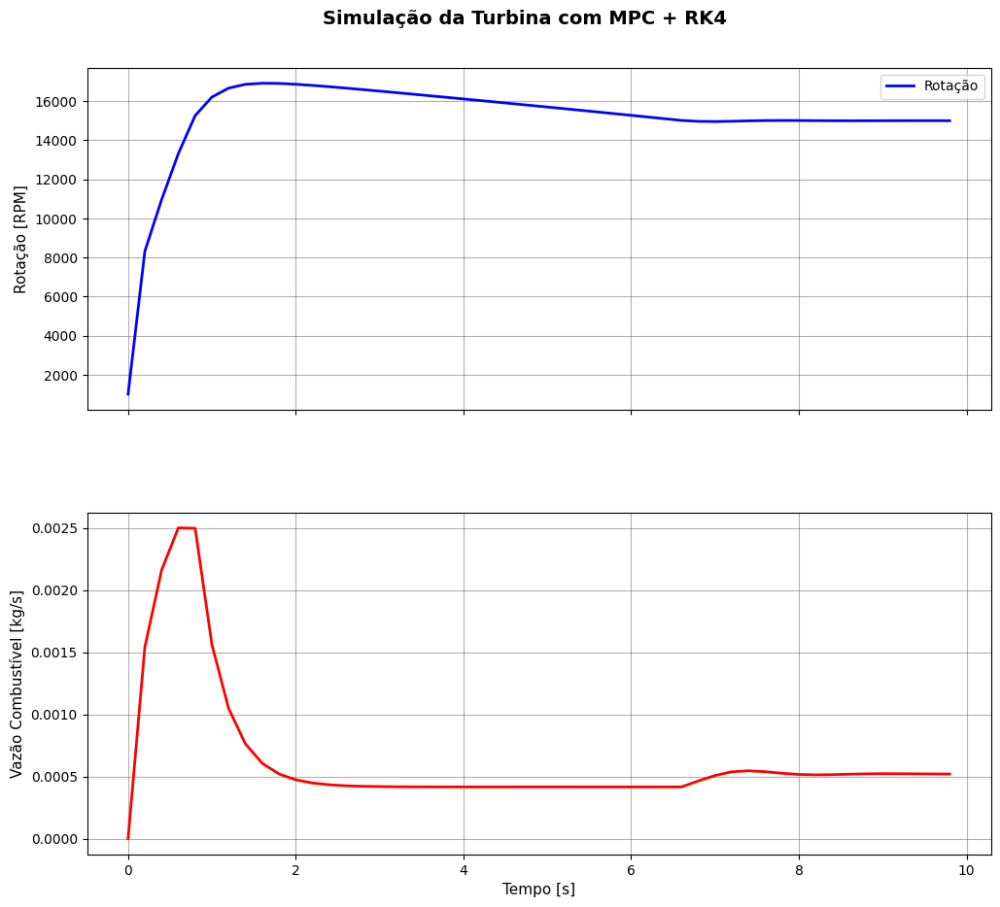

<Figure size 640x480 with 0 Axes>


✅ Simulação concluída! Resultados salvos em 'resultados_simulacao_MPC_RK4.xlsx'.


In [54]:
def simular_turbina_mpc_rk4(arq_ent = 'dados_turbina_080.xlsx', n_steps=50, h=0.2, alpha=0.80):

    # Leitura e pré-processamento de dados do controlador
    data = pd.read_excel(arq_ent)
    data["Tempo (s)"] = data["Tempo (s)"].astype(str).str.replace("[", "").str.replace("]", "").astype(float) #Manipulando a coluna do tempo para tranformar em formato float
    tempo = data["Tempo (s)"].values
    m_comb = data['Vazão de Combustível (kg/s)'].values
    m_ar = data['Vazão de Ar (kg/s)'].values
    N_simulador = data['Rotação (RPM)'].values

    # Criando funções de interpolação
    m_comb_interp = interp1d(tempo, m_comb, kind='cubic', fill_value='extrapolate')
    m_ar_interp = interp1d(tempo, m_ar, kind='cubic', fill_value='extrapolate')

    # Parâmetros da turbina
    I = 0.063085                 
    eta_cc = 0.98              
    PCI = 4.442e7              
    cp = 1004.0              
    T_entrada = 298.15        
    T_saida = 373.482163

    # Equação diferencial da rotação (dN/dt)
    def dNdt(t, N, u):  
        m_comb_t = u             # O controle agr vem do MPC
        m_ar_t = m_ar_interp(t)  # Interpolação para descobrir a vazão de ar

        W_t = eta_cc * m_comb_t * PCI
        W_c = m_ar_t * cp * (T_saida - T_entrada)

        return (1/I) * ((np.pi/30)**(-2)) * ((W_t - W_c) / N)

    # Função para executar um passao de Runge-Kutta de 4ª ordem
    def runge_kutta_step(N, u, t, h): 
        k1 = dNdt(t, N, u)
        k2 = dNdt(t + h/2, N + h*k1/2, u)
        k3 = dNdt(t + h/2, N + h*k2/2, u)
        k4 = dNdt(t + h, N + h*k3, u)
        
        return N + (h/6) * (k1 + 2*k2 + 2*k3 + k4)
    
    # Array para armazenar os dados refetentes ao tempo, rotação e vazões de combustível e ar
    T = np.zeros(n_steps)
    N = np.zeros(n_steps)
    m_comb_hist = np.zeros(n_steps)
    m_ar_hist = np.zeros(n_steps)

    # Condições iniciais
    T[0] = tempo[0]
    N[0] = N_simulador[0]
    u_prev = m_comb_interp(T[0])
    
    # Pegando o objeto mpc criado foi instanciado anteriomente
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais para o loop
    x0 = np.array([0.0, 1000.0]) 
    alpha = 0.45
    u_prev = np.array([0.00042])
    n_steps = 50

    for i in range(1, n_steps):
        t = T[i - 1]                   # Tempo atual
        x0 = np.array([0, N[i-1]])     # Estado atual ajustado para o MPC

        # Passo 1: MPC calcula a vazão de combustível 
        u0 = mpc.make_step(x0)   # ação de controle ótima

        # Passo 2: Suavização do sinal de controle
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()

        # Passo 3: Atualização da rotação via RK4
        N[i] = runge_kutta_step(N[i-1], u_suavizado, t, h)
        T[i] = t + h            # Avança o tempo no passo h

        # Armazena o histórico das vazões
        m_comb_hist[i] = u_suavizado
        m_ar_hist[i] = m_ar_interp(T[i])

    # Plotando os gráficos
    fig, ax = plt.subplots(2, 1, figsize=(12, 10), sharex=True, gridspec_kw={'hspace': 0.3})
    fig.suptitle('Simulação da Turbina com MPC + RK4', y=0.98, fontsize=14, fontweight='bold')

    for a in ax:
        a.grid(True, alpha=0.5, linestyle='-', color='#666665')

    ax[0].plot(T, N, 'b-', linewidth=2, label='Rotação')
    ax[0].set_ylabel('Rotação [RPM]', fontsize=11)
    ax[0].legend(loc='best', fontsize=10)

    ax[1].plot(T, m_comb_hist, 'r-', linewidth=2)
    ax[1].set_ylabel('Vazão Combustível [kg/s]', fontsize=11)

    ax[-1].set_xlabel('Tempo [s]', fontsize=11)  # Adiciona label apenas no último subplot
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

    for a in ax:
        a.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()

    # 🔄 Exportando os resultados
    df_resultado = pd.DataFrame({
        'Tempo (s)': T,
        'Rotação (RPM)': N,
        'Vazão de Combustível (kg/s)': m_comb_hist,
        'Vazão de Ar (kg/s)': m_ar_hist,
    })

    df_resultado.to_excel('resultados_simulacao_malha_fechada.xlsx', index=False)
    
    return T, N, m_comb_hist, m_ar_hist

if __name__ == "__main__":
    simular_turbina_mpc_rk4()
    print("\n✅ Simulação concluída! Resultados salvos em 'resultados_simulacao_MPC_RK4.xlsx'.")


---

### Modelagem das emissões

* Modelando a Reação de Combustão

In [55]:
import cantera as ct

# Carregar o mecanismo gerado (mechanism.yaml)
gas = ct.Solution('mechanism.yaml')

# Listar todas as espécies disponíveis
print(gas.species_names)


['AR', 'N2', 'HE', 'H2', 'H', 'O2', 'O', 'H2O', 'OH', 'H2O2', 'HO2', 'CO', 'CO2', 'HOCO', 'CH4', 'CH3', 'CH2', 'CH2(S)', 'C', 'CH', 'CH3O2H', 'CH3O2', 'CH3OH', 'CH3O', 'CH2OH', 'CH2O', 'HCO', 'HO2CHO', 'HOCHO', 'OCHO', 'C2H6', 'C2H5', 'C2H5O2H', 'C2H5O2', 'C2H4', 'C2H3', 'C2H2', 'C2H', 'C2H5OH', 'C2H5O', 'PC2H4OH', 'SC2H4OH', 'C2H4O2H', 'C2H4O1-2', 'C2H3O1-2', 'CH3CHO', 'CH3CO', 'CH2CHO', 'CH2CO', 'HCCO', 'HCOOH', 'CH3CO3', 'CH3CO3H', 'CH2OHCHO', 'CHOCHO', 'O2C2H4O2H', 'HO2CH2CHO', 'CH3OCHO', 'CH3OCO', 'C3H8', 'IC3H7', 'NC3H7', 'C3H6', 'C3H5-A', 'C3H5-S', 'C3H5-T', 'C3H5O', 'C3H6O', 'CH3CHCHO', 'AC4H7OOH', 'CH3CHCO', 'AC3H5OOH', 'C3H6OH1-2', 'C3H6OH2-1', 'HOC3H6O2', 'SC3H5OH', 'C3H5OH', 'CH2CCH2OH', 'C3H4-P', 'C3H4-A', 'C3H3', 'C3H2', 'C2H5CHO', 'CH2CH2CHO', 'RALD3', 'C2H3CHO', 'CH3COCH3', 'CH3COCH2', 'NC4H10', 'PC4H9', 'SC4H9', 'IC4H10', 'IC4H9', 'TC4H9', 'IC4H8', 'IC4H7', 'IC4H7O', 'C4H8-1', 'C4H8-2', 'C4H71-3', 'C4H71-4', 'C4H71-O', 'C4H6', 'C4H5', 'C4H4', 'C4H3', 'C4H2', 'C6H6', 'F

In [56]:
'''import yaml
from collections import OrderedDict

def load_yaml(filename):
    with open(filename, 'r') as f:
        return yaml.safe_load(f)

# Carregar ambos os mecanismos
mech1 = load_yaml('JetSurf2.yaml')  # Mecanismo base
mech2 = load_yaml('mechanism.yaml')  # Mecanismo com IC16H34

# Estrutura do novo mecanismo combinado
combined_mech = {
    'phases': [{
        'name': 'gas',
        'thermo': 'ideal-gas',
        'kinetics': 'gas',
        'species': [],
        'reactions': []
    }],
    'species': [],
    'reactions': []
}

# Função para combinar elementos únicos
def combine_elements(source, target):
    seen = set()
    for item in target + source:
        if isinstance(item, dict):
            key = item.get('name', item.get('equation'))
        else:
            key = item
            
        if key not in seen:
            seen.add(key)
            yield item

# Combinar espécies
all_species = mech1['species'] + mech2['species']
combined_mech['species'] = list(combine_elements(all_species, []))
combined_mech['phases'][0]['species'] = list(combine_elements(
    mech1['phases'][0]['species'] + mech2['phases'][0]['species'], []
))

# Combinar reações
all_reactions = mech1['reactions'] + mech2['reactions']
combined_mech['reactions'] = list(combine_elements(all_reactions, []))

# Salvar novo arquivo YAML
with open('combined_mechanism.yaml', 'w') as f:
    yaml.dump(combined_mech, f, default_flow_style=False, sort_keys=False)

print("Mecanismo combinado criado com sucesso!")'''

'import yaml\nfrom collections import OrderedDict\n\ndef load_yaml(filename):\n    with open(filename, \'r\') as f:\n        return yaml.safe_load(f)\n\n# Carregar ambos os mecanismos\nmech1 = load_yaml(\'JetSurf2.yaml\')  # Mecanismo base\nmech2 = load_yaml(\'mechanism.yaml\')  # Mecanismo com IC16H34\n\n# Estrutura do novo mecanismo combinado\ncombined_mech = {\n    \'phases\': [{\n        \'name\': \'gas\',\n        \'thermo\': \'ideal-gas\',\n        \'kinetics\': \'gas\',\n        \'species\': [],\n        \'reactions\': []\n    }],\n    \'species\': [],\n    \'reactions\': []\n}\n\n# Função para combinar elementos únicos\ndef combine_elements(source, target):\n    seen = set()\n    for item in target + source:\n        if isinstance(item, dict):\n            key = item.get(\'name\', item.get(\'equation\'))\n        else:\n            key = item\n            \n        if key not in seen:\n            seen.add(key)\n            yield item\n\n# Combinar espécies\nall_species = mech1

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\217619838.py:41: UserWarning: ChemEquil::equilibrate: Temperature (2017.097962084091 K) outside valid range of 300 K to 2000 K
  gas_incomplete.equilibrate("HP")
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\217619838.py:41: UserWarning: ChemEquil::equilibrate: Temperature (2021.3376169438375 K) outside valid range of 300 K to 2000 K
  gas_incomplete.equilibrate("HP")
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\217619838.py:41: UserWarning: ChemEquil::equilibrate: Temperature (2009.9488326187952 K) outside valid range of 300 K to 2000 K
  gas_incomplete.equilibrate("HP")


Figura salva em: c:\pp-mpc\temperaturas.png


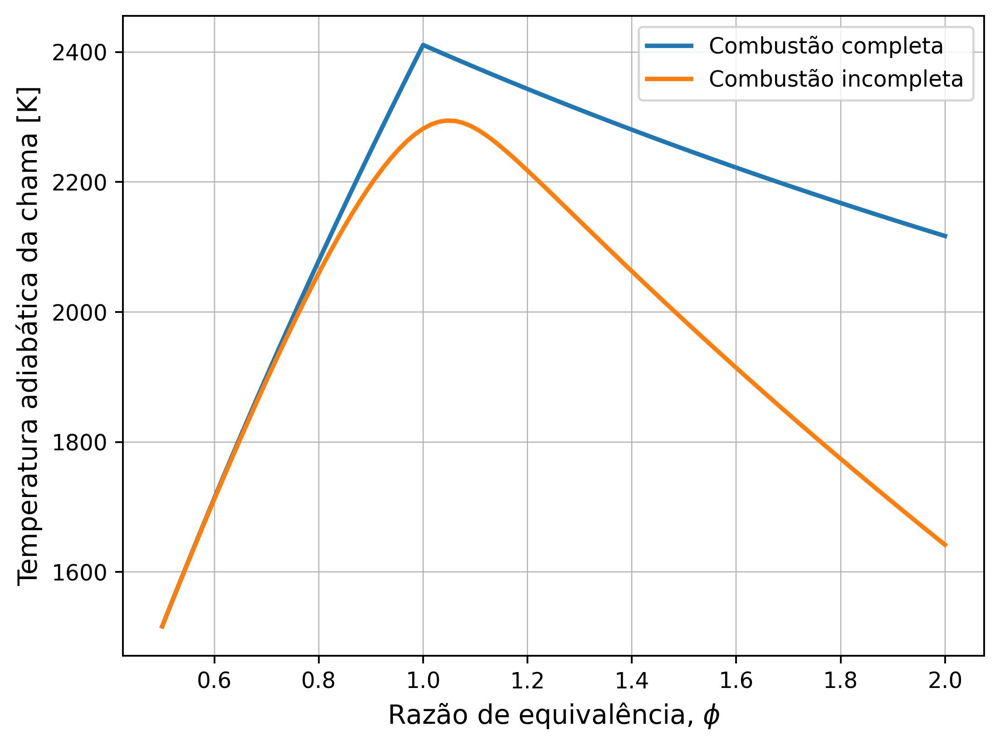

In [57]:
# Carregar todas as espécies do mecanismo
all_species = {S.name: S for S in ct.Species.list_from_file('combined_mechanism.yaml')}

# Definir nomes das espécies relevantes para combustão completa
complete_species_names = ['NC12H26', 'NC10H22', 'NC16H34', 'NC8H18', 'O2', 'N2', 'CO2', 'H2O']
complete_species = [all_species[name] for name in complete_species_names]

# Criar objeto de gás apenas com essas espécies
gas_complete = ct.Solution(thermo='ideal-gas', species=complete_species)

# Composição do combustível S-8 (frações molares)
s8_composition = {
    'NC12H26': 0.2974,
    'NC10H22': 0.4774,
    'NC16H34': 0.1732,
    'NC8H18': 0.0519
}

# Composição do ar
air = {'O2': 1.0, 'N2': 3.76}

# Faixa de razão de equivalência
phi = np.linspace(0.5, 2.0, 100)
T_complete = np.zeros_like(phi)
T_incomplete = np.zeros_like(phi)

# Simulação da combustão completa
for i, p in enumerate(phi):
    gas_complete.TP = 298.15, ct.one_atm
    gas_complete.set_equivalence_ratio(p, s8_composition, air)
    gas_complete.equilibrate("HP")
    T_complete[i] = gas_complete.T

# Criar sistema com todas as espécies do mecanismo para combustão incompleta
gas_incomplete = ct.Solution('combined_mechanism.yaml')

# Simulação da combustão incompleta com o mesmo combustível
for i, p in enumerate(phi):
    gas_incomplete.TP = 298.15, ct.one_atm
    gas_incomplete.set_equivalence_ratio(p, s8_composition, air)
    gas_incomplete.equilibrate("HP")
    T_incomplete[i] = gas_incomplete.T

# Plotagem
plt.figure(dpi = 350)
plt.plot(phi, T_complete, label="Combustão completa", lw=2)
plt.plot(phi, T_incomplete, label="Combustão incompleta", lw=2)
plt.xlabel(r"Razão de equivalência, $\phi$", fontsize=12)
plt.ylabel("Temperatura adiabática da chama [K]", fontsize=12)
#plt.title("Temperatura vs. Razão de Equivalência", fontsize=14)
plt.grid(True, linewidth=0.5)
plt.legend()
plt.tight_layout()
# Salvar figura e confirmar caminho
plt.savefig('temperaturas.png', format='png')
print("Figura salva em:", os.path.abspath("temperaturas.png"))

plt.show()

In [58]:
# Encontrar máximos
max_T_complete = np.max(T_complete)
phi_T_complete = phi[np.argmax(T_complete)]

max_T_incomplete = np.max(T_incomplete)
phi_T_incomplete = phi[np.argmax(T_incomplete)]

print(f"Combustão completa: T_max = {max_T_complete:.2f} K em φ = {phi_T_complete:.2f}")
print(f"Combustão incompleta: T_max = {max_T_incomplete:.2f} K em φ = {phi_T_incomplete:.2f}")


Combustão completa: T_max = 2411.02 K em φ = 1.00
Combustão incompleta: T_max = 2294.65 K em φ = 1.05


#### Fazendo o balaceamento da equação

In [59]:
# Carbono
a,b,c,d = sy.symbols('a b c d')

le_c = (0.29738 * 12) + (0.47744 * 10) + (0.17324 * 16) + (0.05194 * 8)
ld_c = b
b = le_c
print(f'b = {b:.4f}')

b = 11.5303


In [60]:
# hidrogênio

ld_h = (0.29738 * 26) + (0.47744 * 22) + (0.17324 * 34) + (0.05194 * 18)
le_h = 2 * c
eq_hid = sy.Eq(le_h, ld_h)
sol_c = sy.solve(eq_hid, c)[0]
print(f'c = {sol_c:.4f}')

c = 12.5303


In [61]:
# Oxigênio

le_o = 2 * a 
ld_o = (b * 2) + sol_c
eq_oxi = sy.Eq(le_o, ld_o)
sol_a = sy.solve(eq_oxi, a)[0]
print(f'a = {sol_a:.4f}')

a = 17.7955


In [62]:
#  Nitrogênio

ld_n = 3.76 * sol_a
le_n = d 
d = ld_n
print(f'd = {d:.4f}')

d = 66.9110


* Correlação para emissões de NOx

$$EI_{poluente} = \dot{m}_{poluente} / \dot{m}_{combustível}$$

Isolando, tem-se:

$$\dot{m}_{poluente} = EI_{poluente} \cdot \dot{m}_{combustível}$$

Modelo de previsão de emissão:

$$EI_{NOx} = 29 \cdot exp(-21670/T_c) \cdot P_2^{0,66} [1- exp(-250\tau)]$$

In [63]:
RC, p1, p2 = sy.symbols('RC p1 p2')

In [64]:
eq_p2 = sy.Eq(RC, p2/p1)
eq_p2

Eq(RC, p2/p1)

In [65]:
p2_sol = sy.solve(eq_p2,p2)[0]
p2_sol

RC*p1

In [66]:
dic_p2 = {p1: 101325, RC:2.2}

In [67]:
p2_sol_num = p2_sol.subs(dic_p2)
print(f'p2 = {p2_sol_num:.2f} Pa.')

p2 = 222915.00 Pa.


In [68]:
EInox, Tc, tau = sy.symbols('EInox Tc \\tau')

In [69]:
EInox = 29 * sy.exp(-21670/Tc) * ((p2)**0.66) * (1 - sy.exp(-250*tau))
EInox

29*p2**0.66*(1 - exp(-250*\tau))*exp(-21670/Tc)

In [70]:
dic_nox = {p2:p2_sol_num, Tc:2411.02, tau:0.001}

In [71]:
EInox_num = EInox.subs(dic_nox)
EInox_num = float(EInox_num)
print(f'EI_NOx = {EInox_num:.3f} g de poluente/ kg de combustível.')

EI_NOx = 2.714 g de poluente/ kg de combustível.


### Calculando as emissões para cada $\alpha$

#### $\alpha = 0,2$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\1081915054.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\1081915054.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9902007e+08 7.31e+09 3.93e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

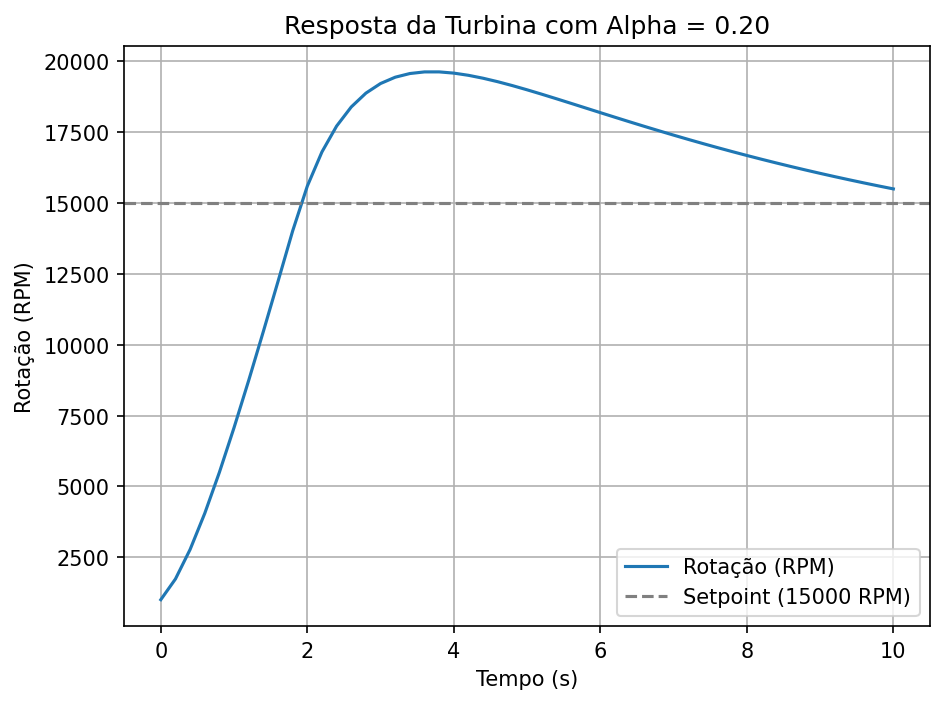

Simulação concluída!


In [72]:
def simular_turbina_alpha020():
    """
    Simula e plota o comportamento da turbina com alpha = 0.20.
    """
    alpha = 0.20
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  
    u_prev = np.array([0.00042])  

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha020.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.20")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha020.png")

    return time_array, m_comb_array, N_array


def main():
    simular_turbina_alpha020()
    plt.show()
    print("Simulação concluída!")


if __name__ == "__main__":
    main()

O desvio padrão de 5.67 RPM indica que, após a estabilização, a rotação oscila em torno do setpoint com uma variação média de ±5.67 RPM.

In [73]:
df020 = pd.read_excel('dados_turbina_alpha020.xlsx')
print(df020.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.000919    1731.450667
2        0.4                     0.001319    2772.198434
3        0.6                     0.001638    4047.293394
4        0.8                     0.001894    5497.151757


In [74]:
df020['Emissões NOx (g/s)'] = df020['Vazão de Combustível (kg/s)'] * EInox_num
df020.to_excel('dados_turbina_emissoesalpha020.xlsx', index=False)

In [75]:
df020 = pd.read_excel('dados_turbina_emissoesalpha020.xlsx')
print(df020.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.000919    1731.450667            0.002495
2        0.4                     0.001319    2772.198434            0.003579
3        0.6                     0.001638    4047.293394            0.004446
4        0.8                     0.001894    5497.151757            0.005140


In [76]:
df020['Tempo (s)'] = pd.to_numeric(df020['Tempo (s)'], errors='coerce')

total_nox = np.trapz(df020['Emissões NOx (g/s)'], x=df020['Tempo (s)'])
print(f"Emissões totais de NOx: {total_nox:.6f} g")

Emissões totais de NOx: 0.024209 g


### $\alpha = 0.4$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\520906462.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\520906462.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


  21  4.5489560e+08 1.88e-04 8.44e+09  -1.0 1.88e+09 -12.6 5.57e-03 1.00e+00f  1
  22  4.2433494e+08 1.76e-04 6.14e+09  -1.0 5.32e+09 -13.1 2.67e-01 1.00e+00f  1
  23  4.0515029e+08 1.54e-04 3.80e+09  -1.0 1.35e+10 -13.5 3.82e-01 2.59e-01f  1
  24  4.0496209e+08 2.23e-04 3.78e+09  -1.0 2.99e+10 -14.0 6.34e-03 1.17e-03f  1
  25  4.0496020e+08 3.01e-04 3.78e+09  -1.0 5.23e+10 -14.5 6.97e-05 6.70e-06f  1
  26  4.0496019e+08 2.84e-04 5.84e+09  -1.0 2.85e+10 -15.0 1.31e-01 1.51e-07f  1
  27  4.0059231e+08 2.35e-04 3.07e+09  -1.0 3.22e+10 -15.5 1.50e-03 1.04e-01f  1
  28  3.9800015e+08 2.56e-04 2.36e+09  -1.0 3.48e+10 -15.9 2.79e-05 6.79e-02f  1
  29  3.9797728e+08 2.62e-04 2.55e+09  -1.0 3.83e+10 -16.4 3.65e-02 6.17e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.9797704e+08 4.07e-04 2.01e+10  -1.0 3.24e+10 -16.9 5.98e-01 7.30e-06f  1
  31  3.9772491e+08 4.01e-04 3.46e+10  -1.0 1.82e+10 -17.4 8.30e-01 3.36e-02f  1
  32  3.9772242e+08 4.11e-04

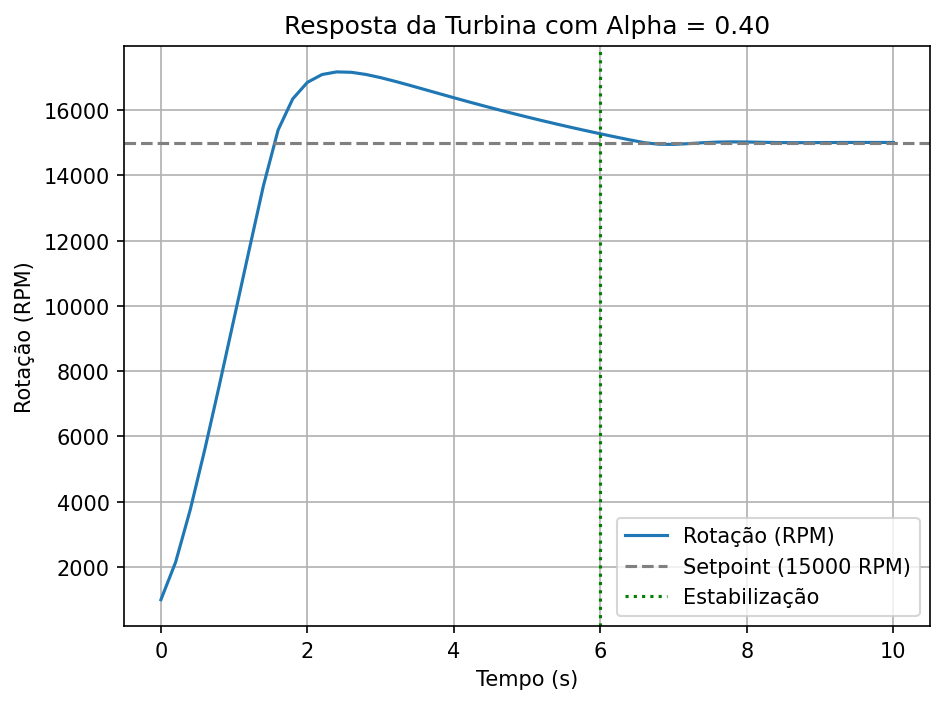

Simulação concluída!


In [77]:
def simular_turbina_alpha040():
    """
    Simula e plota o comportamento da turbina com alpha = 0.40.
    """
    alpha = 0.40
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  
    u_prev = np.array([0.00042])  

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha040.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000
    margem = 0.02 * N_setpoint  # 2%

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização
    tempo_estab = None
    tempo_min_estab = 2.0  # segundos
    pontos_minimos = int(tempo_min_estab / t_step)

    for i in range(len(N_array) - pontos_minimos + 1):
        trecho = N_array[i:]
        if np.all(np.abs(trecho[:pontos_minimos] - N_setpoint) < margem):
            if np.all(np.abs(trecho - N_setpoint) < margem):
                tempo_estab = time_array[i]
                break

    # Ruído
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.40")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha040.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha040()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()



In [78]:
df040 = pd.read_excel('dados_turbina_alpha040.xlsx')
print(df040.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.001419    2144.343200
2        0.4                     0.002018    3751.276784
3        0.6                     0.002377    5609.320626
4        0.8                     0.002593    7592.346474


In [79]:
df040['Emissões NOx (g/s)'] = df040['Vazão de Combustível (kg/s)'] * EInox_num
df040.to_excel('dados_turbina_emissoesalpha040.xlsx', index=False)

In [80]:
df040 = pd.read_excel('dados_turbina_emissoesalpha040.xlsx')
print(df040.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.001419    2144.343200            0.003850
2        0.4                     0.002018    3751.276784            0.005476
3        0.6                     0.002377    5609.320626            0.006451
4        0.8                     0.002593    7592.346474            0.007037


In [81]:
df040['Tempo (s)'] = pd.to_numeric(df040['Tempo (s)'], errors='coerce')

total_nox40 = np.trapz(df040['Emissões NOx (g/s)'], x=df040['Tempo (s)'])
print(f"Emissões totais de NOx : {total_nox40:.6f} g")

Emissões totais de NOx : 0.022645 g


#### $\alpha = 0,60$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\1646521238.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\1646521238.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


   2  4.9208678e+08 1.29e+10 4.22e+05  -1.0 1.30e+10  -4.5 1.79e-01 2.01e-03f  1
   3  4.9208610e+08 1.29e+10 2.10e+10  -1.0 1.29e+10  -5.0 1.00e+00 2.01e-05f  1
   4r 4.9208610e+08 1.29e+10 9.99e+02  10.1 0.00e+00  -5.4 0.00e+00 1.48e-07R  3
   5r 4.9209639e+08 1.80e+10 2.01e+08  10.1 2.24e+17    -  9.88e-06 6.88e-11f  1
   6r 4.6322462e+08 4.21e+10 1.89e+08   3.8 5.66e+12    -  3.21e-01 2.27e-03f  1
   7  4.6070155e+08 5.87e+09 8.55e+03  -1.0 8.05e+09  -5.9 1.00e+00 8.60e-01f  1
   8  4.6068528e+08 5.51e+09 1.08e+04  -1.0 1.12e+09  -6.4 8.94e-01 6.17e-02f  1
   9  4.6068512e+08 5.50e+09 1.87e+07  -1.0 1.05e+09  -6.9 1.00e+00 6.57e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.6068512e+08 5.50e+09 2.81e+12  -1.0 1.05e+09  -7.3 1.00e+00 6.60e-06h  1
  11  4.6067892e+08 5.44e+09 2.36e+14  -1.0 1.24e+09  -7.8 1.00e+00 1.17e-02f  1
  12  4.6034674e+08 1.89e+09 2.63e+13  -1.0 1.23e+09  -8.3 1.00e+00 6.53e-01f  1
  13  4.6034349e+08 1.85e+09

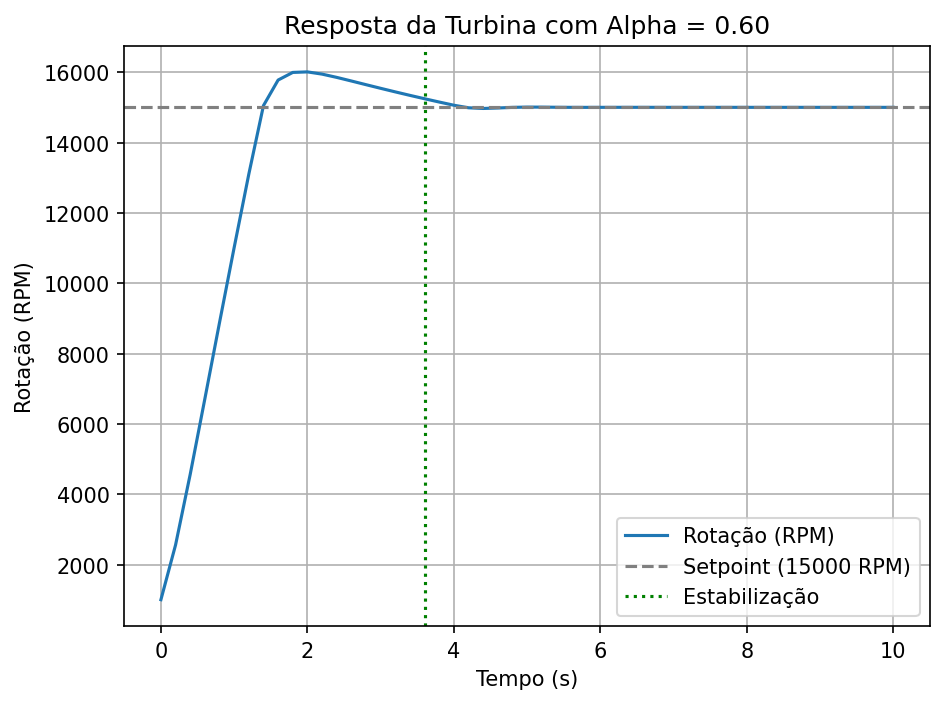

Simulação concluída!


In [82]:
def simular_turbina_alpha060():
    """
    Simula e plota o comportamento da turbina com alpha = 0.60.
    """
    alpha = 0.60
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha060.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.60")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha060.png")

    return time_array, m_comb_array, N_array


def main():
    simular_turbina_alpha060()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [83]:
df060 = pd.read_excel('dados_turbina_alpha060.xlsx')
print(df060.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.001918    2557.235733
2        0.4                     0.002517    4565.198121
3        0.6                     0.002757    6713.653713
4        0.8                     0.002853    8879.652640


In [84]:
df060['Emissões NOx (g/s)'] = df060['Vazão de Combustível (kg/s)'] * EInox_num
df060.to_excel('dados_turbina_emissoesalpha060.xlsx', index=False)

In [85]:
df060 = pd.read_excel('dados_turbina_emissoesalpha060.xlsx')
print(df060.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.001918    2557.235733            0.005205
2        0.4                     0.002517    4565.198121            0.006831
3        0.6                     0.002757    6713.653713            0.007481
4        0.8                     0.002853    8879.652640            0.007741


In [86]:
df060['Tempo (s)'] = pd.to_numeric(df060['Tempo (s)'], errors='coerce')

total_nox60 = np.trapz(df060['Emissões NOx (g/s)'], x=df060['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox60:.6f} g")

Emissões totais de NOx (trapézio): 0.022377 g


### $\alpha = 0.70$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2630036508.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2630036508.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


  24  2.2871833e+08 2.48e-04 1.46e+09  -1.0 2.83e+10 -14.0 5.90e-01 4.21e-03f  1
  25  2.2871448e+08 2.37e-04 1.43e+09  -1.0 4.67e+10 -14.5 1.37e-02 2.55e-05f  1
  26  2.2864189e+08 2.29e-04 1.43e+09  -1.0 4.45e+10 -15.0 1.31e-04 6.86e-04f  1
  27  2.2843408e+08 2.40e-04 1.43e+09  -1.0 5.22e+10 -15.5 1.70e-06 1.73e-03f  1
  28  2.1459996e+08 2.76e-04 1.27e+09  -1.0 6.19e+10 -15.9 2.06e-01 1.14e-01f  1
  29  2.1446982e+08 3.37e-04 2.30e+09  -1.0 5.58e+10 -16.4 1.13e-01 1.27e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  2.1446845e+08 3.99e-04 6.32e+09  -1.0 4.92e+10 -16.9 3.94e-01 1.44e-05f  1
  31  2.1260420e+08 4.80e-04 1.15e+10  -1.0 3.69e+10 -17.4 4.34e-01 4.78e-02f  1
  32  2.1210612e+08 4.49e-04 1.92e+10  -1.0 3.52e+10 -17.8 1.00e+00 1.38e-02f  1
  33  2.1210115e+08 4.26e-04 1.92e+10  -1.0 3.41e+10 -18.3 6.00e-01 1.42e-04f  1
  34  2.1199098e+08 5.08e-04 2.11e+10  -1.0 2.21e+10 -18.8 4.02e-01 9.89e-03f  1
  35  2.0874830e+08 3.19e-04

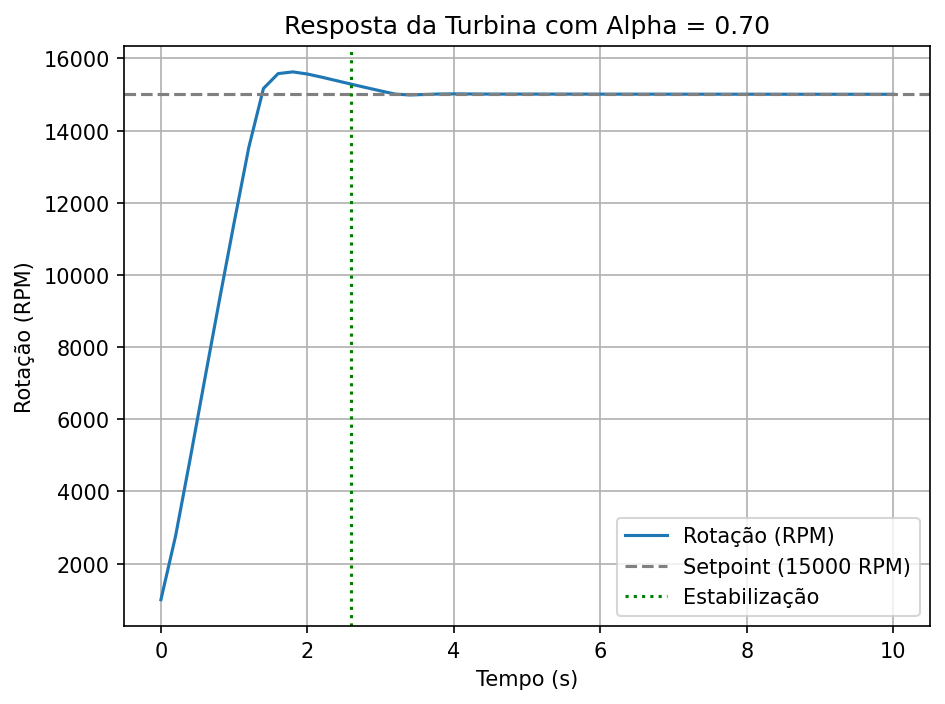

Simulação concluída!


In [87]:
def simular_turbina_alpha070():
    """
    Simula e plota o comportamento da turbina com alpha = 0.70.
    """
    alpha = 0.70
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha070.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.70")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha070.png")

    return time_array, m_comb_array, N_array


def main():
    simular_turbina_alpha070()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [88]:
df070 = pd.read_excel('dados_turbina_alpha070.xlsx')
print(df070.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.002168    2763.682000
2        0.4                     0.002692    4910.224909
3        0.6                     0.002849    7125.151892
4        0.8                     0.002896    9315.455251


In [89]:
df070['Emissões NOx (g/s)'] = df070['Vazão de Combustível (kg/s)'] * EInox_num
df070.to_excel('dados_turbina_emissoesalpha070.xlsx', index=False)

In [90]:
df070 = pd.read_excel('dados_turbina_emissoesalpha070.xlsx')
print(df070.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.002168    2763.682000            0.005882
2        0.4                     0.002692    4910.224909            0.007305
3        0.6                     0.002849    7125.151892            0.007732
4        0.8                     0.002896    9315.455251            0.007860


In [91]:
df070['Tempo (s)'] = pd.to_numeric(df070['Tempo (s)'], errors='coerce')

total_nox70 = np.trapz(df070['Emissões NOx (g/s)'], x=df070['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox70:.6f} g")

Emissões totais de NOx (trapézio): 0.022343 g


### $\alpha = 0,75$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\4193396844.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\4193396844.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9902007e+08 1.87e+10 3.93e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

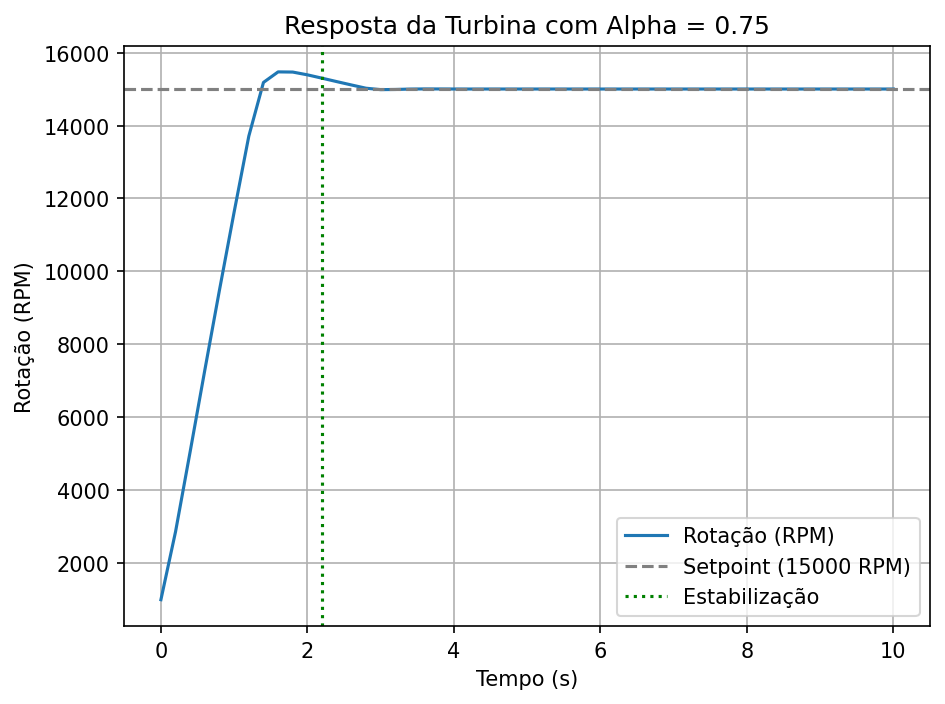

Simulação concluída!


In [92]:
def simular_turbina_alpha075():
    """
    Simula e plota o comportamento da turbina com alpha = 0.75.
    """
    alpha = 0.75
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha075.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.75")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha075.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha075()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [93]:
df075 = pd.read_excel('dados_turbina_alpha075.xlsx')
print(df075.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.002293    2866.905133
2        0.4                     0.002761    5067.254834
3        0.6                     0.002878    7301.153106
4        0.8                     0.002907    9495.057226


In [94]:
df075['Emissões NOx (g/s)'] = df075['Vazão de Combustível (kg/s)'] * EInox_num
df075.to_excel('dados_turbina_emissoesalpha075.xlsx', index=False)

In [95]:
df075 = pd.read_excel('dados_turbina_emissoesalpha075.xlsx')
print(df075.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.002293    2866.905133            0.006221
2        0.4                     0.002761    5067.254834            0.007491
3        0.6                     0.002878    7301.153106            0.007809
4        0.8                     0.002907    9495.057226            0.007888


In [96]:
df075['Tempo (s)'] = pd.to_numeric(df075['Tempo (s)'], errors='coerce')

total_nox75 = np.trapz(df075['Emissões NOx (g/s)'], x=df075['Tempo (s)'])
print(f"Emissões totais de NOx: {total_nox75:.6f} g")

Emissões totais de NOx: 0.022330 g


#### $\alpha = 0,80$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2422793414.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2422793414.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9902007e+08 1.97e+10 3.93e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

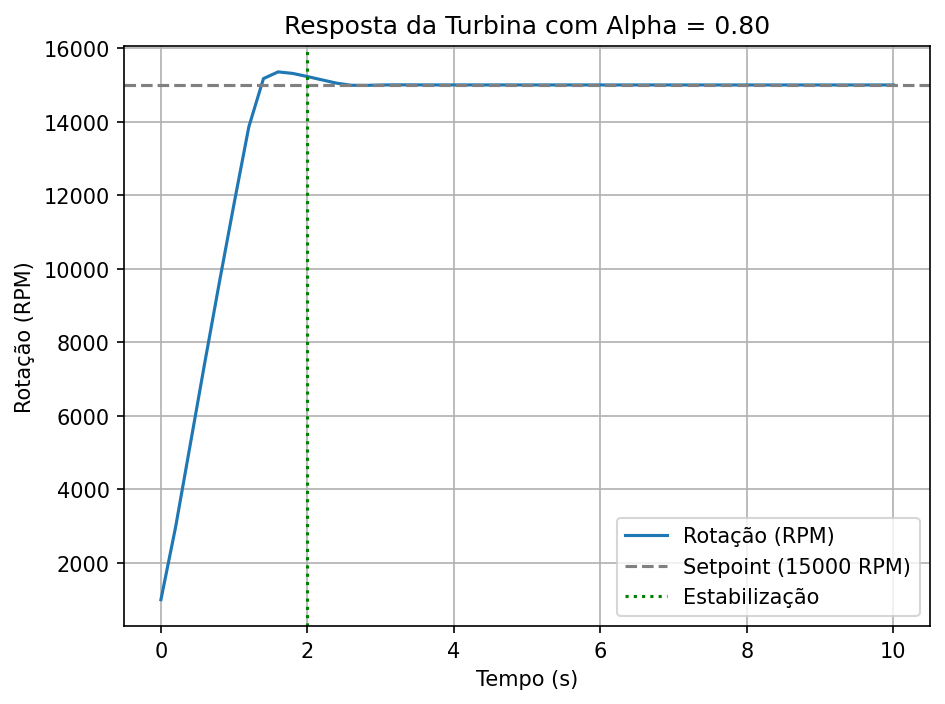

Simulação concluída!


In [97]:
def simular_turbina_alpha080():
    """
    Simula e plota o comportamento da turbina com alpha = 0.80.
    """
    alpha = 0.80
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha080.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.80")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha080.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha080()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [98]:
df080 = pd.read_excel('dados_turbina_alpha080.xlsx')
print(df080.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.002417    2970.128266
2        0.4                     0.002817    5213.962445
3        0.6                     0.002897    7459.386864
4        0.8                     0.002913    9653.505587


In [99]:
df080['Emissões NOx (g/s)'] = df080['Vazão de Combustível (kg/s)'] * EInox_num
df080.to_excel('dados_turbina_emissoesalpha080.xlsx', index=False)

In [100]:
df080 = pd.read_excel('dados_turbina_emissoesalpha080.xlsx')
print(df080.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.002417    2970.128266            0.006560
2        0.4                     0.002817    5213.962445            0.007644
3        0.6                     0.002897    7459.386864            0.007861
4        0.8                     0.002913    9653.505587            0.007904


In [101]:
df080['Tempo (s)'] = pd.to_numeric(df080['Tempo (s)'], errors='coerce')

total_nox80 = np.trapz(df080['Emissões NOx (g/s)'], x=df080['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox80:.6f} g")

Emissões totais de NOx (trapézio): 0.022331 g


### $\alpha = 0.85$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2087914182.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2087914182.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


  24  3.3531903e+08 1.63e-04 5.45e+09  -1.0 2.67e+10 -14.0 4.18e-01 4.62e-03f  1
  25  3.3531310e+08 3.13e-04 5.41e+09  -1.0 4.72e+10 -14.5 8.23e-03 2.62e-05f  1
  26  3.3530535e+08 2.93e-04 1.34e+10  -1.0 3.98e+10 -15.0 4.77e-01 1.03e-04f  1
  27  3.3393758e+08 2.67e-04 1.89e+10  -1.0 3.65e+10 -15.5 3.03e-01 3.63e-02f  1
  28  3.2734791e+08 2.35e-04 2.19e+10  -1.0 3.68e+10 -15.9 6.32e-01 1.97e-01f  1
  29  3.2728908e+08 3.38e-04 2.59e+10  -1.0 3.01e+10 -16.4 7.07e-01 2.40e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.2728829e+08 4.31e-04 3.02e+10  -1.0 1.69e+10 -16.9 1.00e+00 5.68e-05f  1
  31  3.2517668e+08 1.78e-04 1.83e+10  -1.0 1.69e+10 -17.4 1.00e+00 4.31e-01f  1
  32  3.2516142e+08 2.02e-04 1.82e+10  -1.0 9.65e+09 -17.8 1.00e+00 7.57e-03f  1
  33  3.2516126e+08 2.74e-04 1.87e+10  -1.0 5.95e+09 -18.3 1.00e+00 1.23e-04f  1
  34  3.2511004e+08 1.45e-04 1.17e+10  -1.0 2.81e+09 -18.8 1.00e+00 4.03e-01f  1
  35  3.2508172e+08 1.77e-04

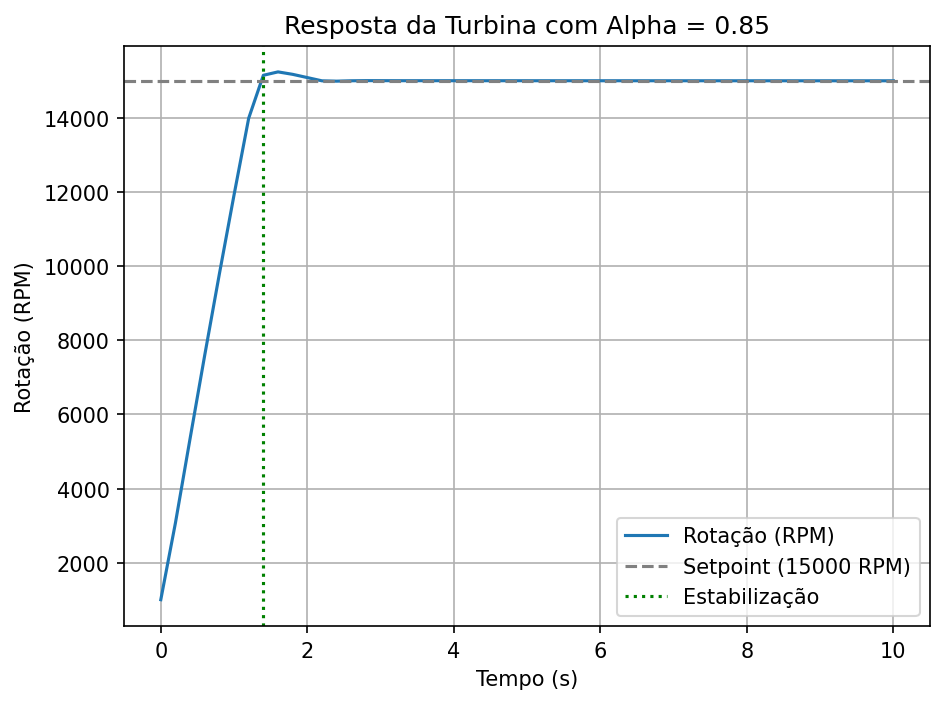

Simulação concluída!


In [102]:
def simular_turbina_alpha085():
    """
    Simula e plota o comportamento da turbina com alpha = 0.85.
    """
    alpha = 0.85
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha085.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.85")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha085.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha085()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [103]:
df085 = pd.read_excel('dados_turbina_alpha085.xlsx')
print(df085.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.002542    3073.351399
2        0.4                     0.002861    5350.347742
3        0.6                     0.002908    7601.401512
4        0.8                     0.002915    9793.697704


In [104]:
df085['Emissões NOx (g/s)'] = df085['Vazão de Combustível (kg/s)'] * EInox_num
df085.to_excel('dados_turbina_emissoesalpha085.xlsx', index=False)

In [105]:
df085 = pd.read_excel('dados_turbina_emissoesalpha085.xlsx')
print(df085.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.002542    3073.351399            0.006899
2        0.4                     0.002861    5350.347742            0.007762
3        0.6                     0.002908    7601.401512            0.007892
4        0.8                     0.002915    9793.697704            0.007912


In [106]:
df085['Tempo (s)'] = pd.to_numeric(df085['Tempo (s)'], errors='coerce')

total_nox85 = np.trapz(df085['Emissões NOx (g/s)'], x=df085['Tempo (s)'])
print(f"Emissões totais de NOx: {total_nox85:.6f} g")

Emissões totais de NOx: 0.022336 g


### $\alpha = 0,90$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\913653781.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\913653781.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


  22  4.4069020e+08 2.17e-04 1.45e+11  -1.0 5.87e+08 -12.1 2.05e-02 1.66e-04f  1
  23  4.4068437e+08 2.36e-04 1.28e+11  -1.0 1.45e+09 -12.6 9.03e-02 1.80e-03f  1
  24  4.4006151e+08 2.52e-04 1.31e+11  -1.0 4.16e+09 -13.1 2.75e-03 6.69e-02f  1
  25  4.4005486e+08 2.61e-04 6.19e+10  -1.0 9.53e+09 -13.5 3.95e-01 2.92e-04f  1
  26  4.3988034e+08 2.97e-04 2.18e+10  -1.0 1.76e+10 -14.0 6.05e-01 7.75e-03f  1
  27  4.3987844e+08 3.67e-04 2.19e+10  -1.0 2.28e+10 -14.5 1.47e-02 5.96e-05f  1
  28  4.3982919e+08 4.30e-04 2.18e+10  -1.0 2.28e+10 -15.0 1.33e-04 3.65e-03f  1
  29  4.3979154e+08 5.09e-04 2.17e+10  -1.0 2.55e+10 -15.5 1.34e-06 2.06e-03f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  30  3.2234585e+08 4.38e-04 2.23e+10  -1.0 8.37e+10 -15.9 1.11e-05 2.45e-01f  1
  31  3.2133380e+08 4.72e-04 2.21e+10  -1.0 6.51e+10 -16.4 5.86e-03 3.15e-03f  1
  32  3.2132370e+08 4.48e-04 2.21e+10  -1.0 6.53e+10 -16.9 5.94e-05 3.14e-05f  1
  33  3.2132360e+08 5.67e-04

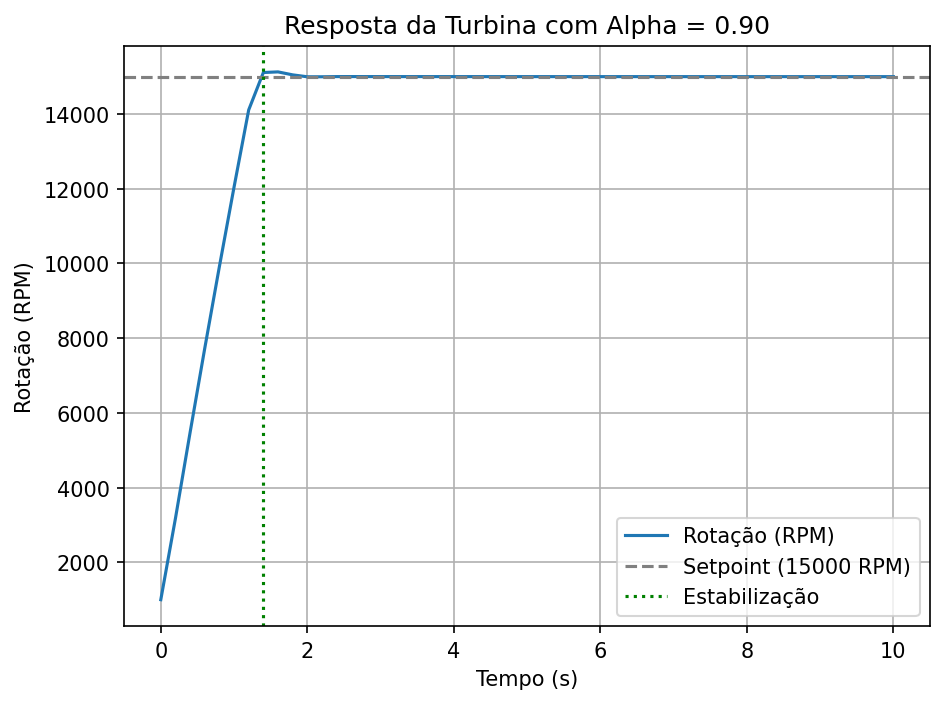

Simulação concluída!


In [107]:
def simular_turbina_alpha090():
    """
    Simula e plota o comportamento da turbina com alpha = 0.90.
    """
    alpha = 0.90
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  
    u_prev = np.array([0.00042])  

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha090.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000
    margem = 0.02 * N_setpoint  # 2%

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização
    tempo_estab = None
    tempo_min_estab = 2.0  # segundos
    pontos_minimos = int(tempo_min_estab / t_step)

    for i in range(len(N_array) - pontos_minimos + 1):
        trecho = N_array[i:]
        if np.all(np.abs(trecho[:pontos_minimos] - N_setpoint) < margem):
            if np.all(np.abs(trecho - N_setpoint) < margem):
                tempo_estab = time_array[i]
                break

    # Ruído
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")
    
    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 0.90")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha090.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha090()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [108]:
df090 = pd.read_excel('dados_turbina_alpha090.xlsx')
print(df090.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.002667    3176.574533
2        0.4                     0.002892    5476.410726
3        0.6                     0.002914    7728.745401
4        0.8                     0.002916    9918.221281


In [109]:
df090['Emissões NOx (g/s)'] = df090['Vazão de Combustível (kg/s)'] * EInox_num
df090.to_excel('dados_turbina_emissoesalpha090.xlsx', index=False)

In [110]:
df090 = pd.read_excel('dados_turbina_emissoesalpha090.xlsx')
print(df090.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.002667    3176.574533            0.007237
2        0.4                     0.002892    5476.410726            0.007847
3        0.6                     0.002914    7728.745401            0.007908
4        0.8                     0.002916    9918.221281            0.007914


In [111]:
df090['Tempo (s)'] = pd.to_numeric(df090['Tempo (s)'], errors='coerce')

total_nox90 = np.trapz(df090['Emissões NOx (g/s)'], x=df090['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox90:.6f} g")

Emissões totais de NOx (trapézio): 0.022341 g


### $\alpha = 1$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2661968189.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2661968189.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


   8  2.5757956e+08 5.06e+10 9.57e+06  -1.0 1.16e+10  -6.4 1.00e+00 5.04e-04h  1
   9r 2.5757956e+08 5.06e+10 9.99e+02   8.3 0.00e+00  -6.9 0.00e+00 3.15e-07R  5
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 2.5609335e+08 4.23e+10 1.35e+08   8.3 7.78e+16    -  2.24e-05 1.34e-08f  1
  11r 2.5351073e+08 4.47e+10 1.34e+08   3.4 1.24e+12    -  6.09e-02 1.05e-03f  1
  12  2.5438947e+08 3.69e+09 5.94e+02  -1.0 1.42e+10  -7.3 1.00e+00 9.17e-01h  1
  13  2.5440061e+08 3.28e+09 6.42e+03  -1.0 1.17e+09  -7.8 9.18e-01 1.11e-01h  1
  14  2.5440072e+08 3.28e+09 3.62e+06  -1.0 1.04e+09  -8.3 1.00e+00 1.25e-03h  1
  15  2.5440072e+08 3.28e+09 2.86e+11  -1.0 1.04e+09  -8.8 1.00e+00 1.25e-05h  1
  16  2.5437134e+08 3.24e+09 1.01e+13  -1.0 1.58e+09  -9.2 3.82e-01 1.06e-02f  1
  17  2.5236478e+08 8.62e+08 2.27e+12  -1.0 1.57e+09  -9.7 1.00e+00 7.34e-01f  1
  18  2.5234420e+08 8.38e+08 5.61e+12  -1.0 4.17e+08 -10.2 1.00e+00 2.81e-02f  1
  19  2.5234396e+08 8.37e+08

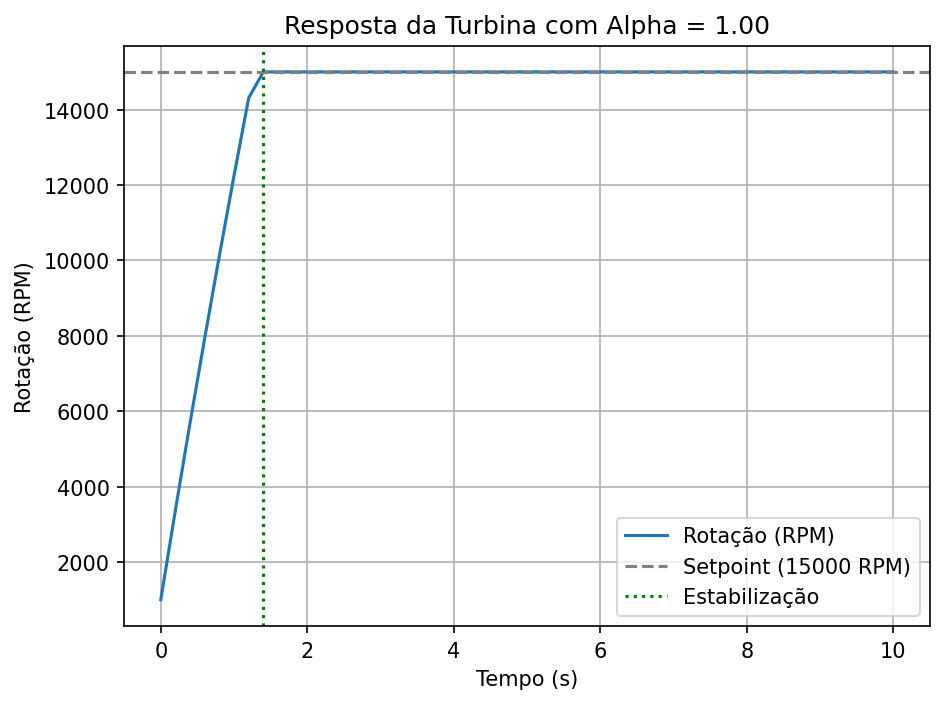

Simulação concluída!


In [112]:
def simular_turbina_alpha1():
    """
    Simula e plota o comportamento da turbina com alpha = 0.60.
    """
    alpha = 1.00
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha1.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 1.00")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha1.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha1()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()


In [113]:
df1 = pd.read_excel('dados_turbina_alpha1.xlsx')
print(df1.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.002917    3383.020799
2        0.4                     0.002917    5697.569755
3        0.6                     0.002917    7945.614282
4        0.8                     0.002917   10129.065270


In [114]:
df1['Emissões NOx (g/s)'] = df1['Vazão de Combustível (kg/s)'] * EInox_num
df1.to_excel('dados_turbina_emissoesalpha1.xlsx', index=False)

In [115]:
df1 = pd.read_excel('dados_turbina_emissoesalpha1.xlsx')
print(df1.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.002917    3383.020799            0.007915
2        0.4                     0.002917    5697.569755            0.007915
3        0.6                     0.002917    7945.614282            0.007915
4        0.8                     0.002917   10129.065270            0.007915


In [116]:
df1['Tempo (s)'] = pd.to_numeric(df1['Tempo (s)'], errors='coerce')

total_nox1 = np.trapz(df1['Emissões NOx (g/s)'], x=df1['Tempo (s)'])
print(f"Emissões totais de NOx: {total_nox1:.6f} g")

Emissões totais de NOx: 0.022358 g


### $\alpha = 1,2 $

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2073051843.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\2073051843.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.9902007e+08 2.80e+10 3.93e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  4.9160493e+08 2.51e+10 2.82e+05  -1.0 2.80e+10  -4.0 1.00e+00 1.01e-01f  1
   2  4.9153158e+08 2.51e+10 4.20e+05  -1.0 2.51e+10  -4.5 1.07e-01 1.12e-03f  1
   3  4.9153085e+08 2.51e+10 1.55e+10  -1.0 2.51e+10  -5.0 4.13e-01 1.12e-05f  1
   4r 4.9153085e+0

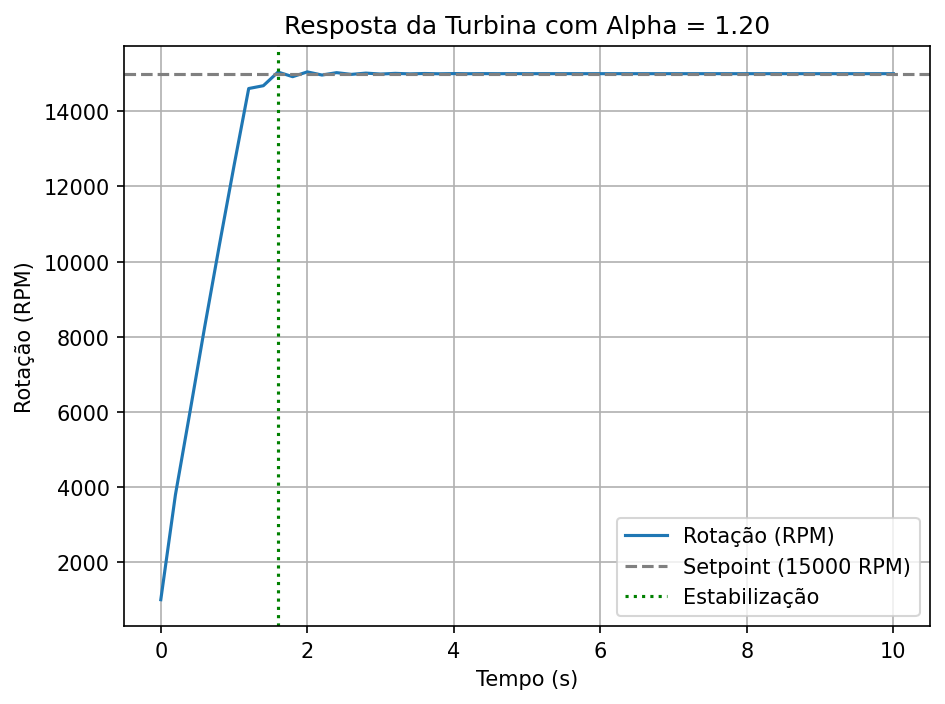

Simulação concluída!


In [117]:
def simular_turbina_alpha120():
    """
    Simula e plota o comportamento da turbina com alpha = 0.60.
    """
    alpha = 1.20
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha120.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 1.20")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha120.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha120()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [118]:
df120 = pd.read_excel('dados_turbina_alpha120.xlsx')
print(df120.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
0        0.0                     0.000420    1000.000000
1        0.2                     0.003416    3795.913332
2        0.4                     0.002817    6016.020052
3        0.6                     0.002937    8271.430181
4        0.8                     0.002913   10442.216291


In [119]:
df120['Emissões NOx (g/s)'] = df120['Vazão de Combustível (kg/s)'] * EInox_num
df120.to_excel('dados_turbina_emissoesalpha120.xlsx', index=False)

In [120]:
df120 = pd.read_excel('dados_turbina_emissoesalpha120.xlsx')
print(df120.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.003416    3795.913332            0.009270
2        0.4                     0.002817    6016.020052            0.007644
3        0.6                     0.002937    8271.430181            0.007969
4        0.8                     0.002913   10442.216291            0.007904


In [121]:
df120['Tempo (s)'] = pd.to_numeric(df120['Tempo (s)'], errors='coerce')

total_nox120 = np.trapz(df120['Emissões NOx (g/s)'], x=df120['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox120:.6f} g")

Emissões totais de NOx (trapézio): 0.022390 g


### $\alpha = 1,4$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\418277684.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\418277684.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 1.1122995e+08 4.19e+10 1.23e+08   8.3 1.20e+17    -  2.22e-05 1.30e-08f  1
  11r 1.0829513e+08 4.15e+10 1.22e+08   3.4 2.01e+12    -  6.81e-02 1.05e-03f  1
  12  1.0868704e+08 2.29e+09 5.73e+02  -1.0 1.33e+10  -7.3 1.00e+00 9.45e-01h  1
  13  1.0869336e+08 1.90e+09 6.07e+03  -1.0 7.33e+08  -7.8 9.46e-01 1.71e-01h  1
  14  1.0869342e+08 1.90e+09 2.35e+06  -1.0 6.08e+08  -8.3 1.00e+00 2.06e-03h  1
  15  1.0869343e+08 1.90e+09 1.12e+11  -1.0 6.08e+08  -8.8 1.00e+00 2.07e-05h  1
  16  1.0868529e+08 1.88e+09 1.61e+13  -1.0 9.36e+08  -9.2 1.00e+00 6.88e-03f  1
  17  1.0805330e+08 8.66e+08 2.41e+12  -1.0 9.30e+08  -9.7 1.00e+00 5.40e-01f  1
  18  1.0804688e+08 8.56e+08 2.10e+12  -1.0 4.28e+08 -10.2 1.00e+00 1.19e-02f  1
  19  1.0804670e+08 8.56e+08 2.65e+12  -1.0 4.23e+08 -10.7 1.00e+00 3.20e-04f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.0745740e+08 1.58e-04

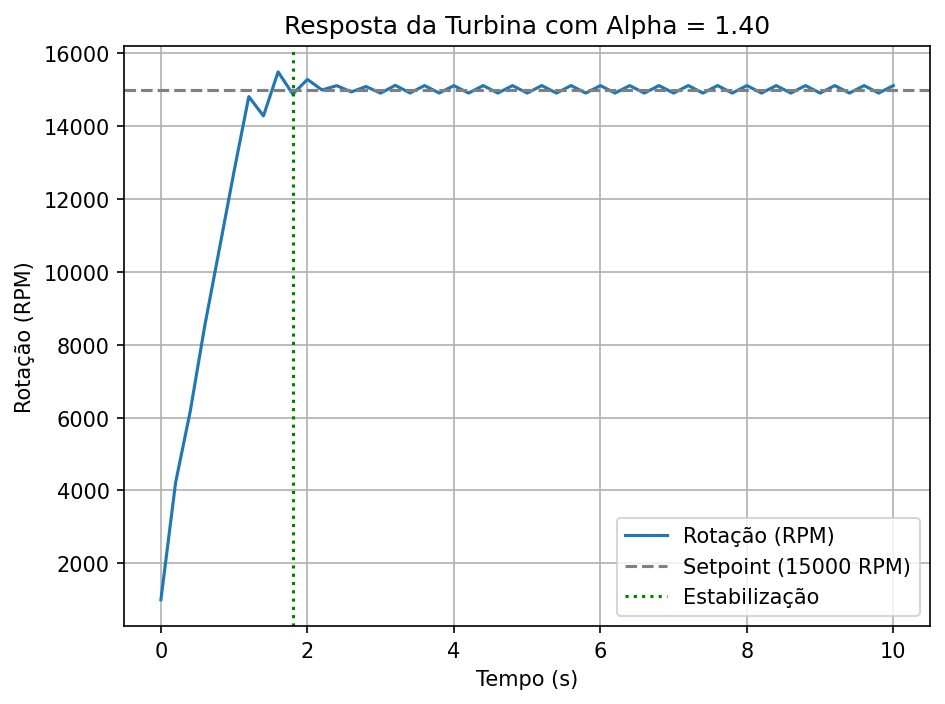

Simulação concluída!


In [122]:
def simular_turbina_alpha140():
    """
    Simula e plota o comportamento da turbina com alpha = 0.60.
    """
    alpha = 1.40
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha140.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 1.40")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha140.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha140()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [123]:
df140 = pd.read_excel('dados_turbina_alpha140.xlsx')
print(df140.tail())

    Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
46        9.2                     0.000767   15115.793569
47        9.4                     0.000277   14910.201381
48        9.6                     0.000767   15115.882526
49        9.8                     0.000277   14910.252905
50       10.0                     0.000767   15115.789141


In [124]:
df140['Emissões NOx (g/s)'] = df140['Vazão de Combustível (kg/s)'] * EInox_num
df140.to_excel('dados_turbina_emissoesalpha140.xlsx', index=False)

In [125]:
df140 = pd.read_excel('dados_turbina_emissoesalpha140.xlsx')
print(df140.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.003915    4208.805865            0.010625
2        0.4                     0.002517    6169.313338            0.006831
3        0.6                     0.003076    8535.928767            0.008349
4        0.8                     0.002853   10649.567880            0.007741


In [126]:
df140['Tempo (s)'] = pd.to_numeric(df140['Tempo (s)'], errors='coerce')

total_nox140 = np.trapz(df140['Emissões NOx (g/s)'], x=df140['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox140:.6f} g")

Emissões totais de NOx (trapézio): 0.022440 g


### $\alpha = 1,6$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\775655415.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\775655415.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


  15  1.9712713e+08 2.31e+09 4.89e+13  -1.0 7.15e+08  -9.7 1.00e+00 1.96e-02f  1
  16  1.9703660e+08 1.82e+09 3.93e+13  -1.0 7.00e+08 -10.2 1.00e+00 2.14e-01f  1
  17  1.9703557e+08 1.81e+09 3.96e+13  -1.0 5.48e+08 -10.7 1.00e+00 2.75e-03f  1
  18  1.9703223e+08 1.81e+09 3.95e+13  -1.0 8.18e+08 -11.2 1.00e+00 2.79e-03f  1
  19  1.9555816e+08 1.34e-04 8.26e-01  -1.0 7.83e+08 -11.6 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  20  1.9428040e+08 2.13e-04 7.02e+09  -8.6 3.39e+08 -12.1 8.91e-01 1.00e+00f  1
  21  1.9040975e+08 1.90e-04 5.95e+09  -8.6 1.19e+09 -12.6 2.84e-08 1.00e+00f  1
  22  1.7873236e+08 1.59e-04 3.08e+09  -8.6 4.76e+09 -13.1 7.87e-02 1.00e+00f  1
  23  1.5762418e+08 2.14e-04 1.93e+09  -8.6 1.18e+10 -13.5 1.27e-05 7.37e-01f  1
In iteration 23, 1 Slack too small, adjusting variable bound
  24  1.5762418e+08 2.29e-04 1.89e+09  -8.6 1.75e+10 -14.0 2.92e-02 1.56e-09f  1
In iteration 24, 1 Slack too small, adjusting va

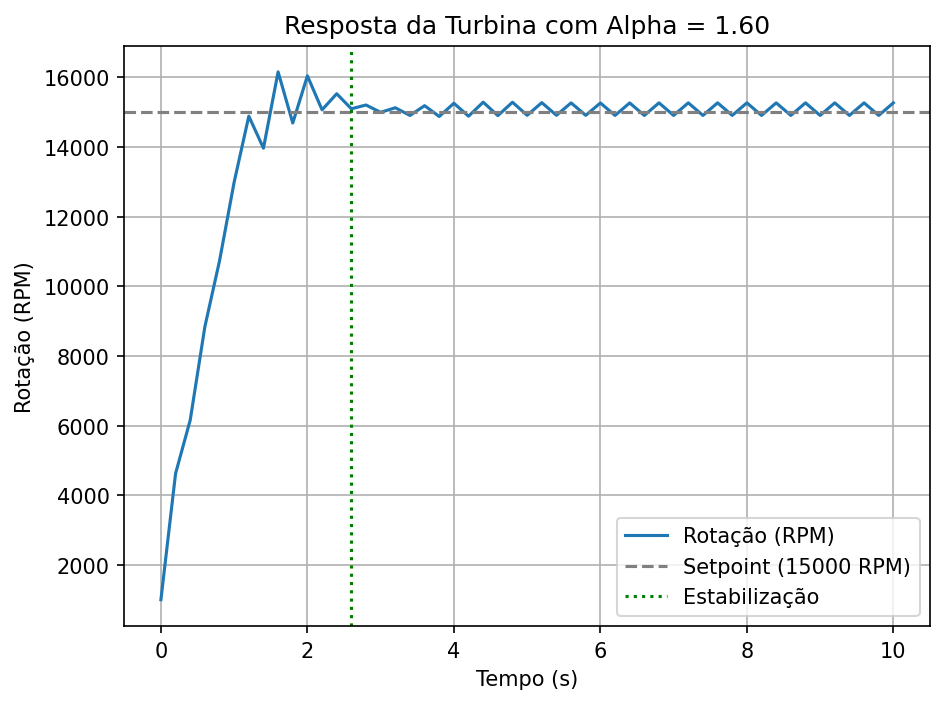

Simulação concluída!


In [127]:
def simular_turbina_alpha160():
    """
    Simula e plota o comportamento da turbina com alpha = 0.60.
    """
    alpha = 1.60
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha160.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 1.60")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha160.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha160()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [128]:
df160 = pd.read_excel('dados_turbina_alpha160.xlsx')
print(df160.tail())

    Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
46        9.2                     0.000954   15266.815273
47        9.4                     0.000094   14905.845248
48        9.6                     0.000955   15266.851717
49        9.8                     0.000094   14905.849762
50       10.0                     0.000955   15266.867617


In [129]:
df160['Emissões NOx (g/s)'] = df160['Vazão de Combustível (kg/s)'] * EInox_num
df160.to_excel('dados_turbina_emissoesalpha160.xlsx', index=False)

In [130]:
df160 = pd.read_excel('dados_turbina_emissoesalpha160.xlsx')
print(df160.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.004415    4621.698398            0.011980
2        0.4                     0.002018    6157.449607            0.005476
3        0.6                     0.003456    8838.204247            0.009378
4        0.8                     0.002593   10728.453893            0.007037


In [131]:
df160['Tempo (s)'] = pd.to_numeric(df160['Tempo (s)'], errors='coerce')

total_nox160 = np.trapz(df160['Emissões NOx (g/s)'], x=df160['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox160:.6f} g")

Emissões totais de NOx (trapézio): 0.022584 g


### $\alpha = 1,8$

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\1334604762.py:29: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  m_comb_array.append(float(u_suavizado[0]))
C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\1334604762.py:30: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  N_array.append(float(x0[1]))


   3  4.9129200e+08 3.74e+10 8.67e+09  -1.0 3.74e+10  -5.0 1.60e-01 7.77e-06f  1
   4r 4.9129200e+08 3.74e+10 9.99e+02  10.6 0.00e+00  -5.4 0.00e+00 7.00e-08R  2
   5r 4.9129275e+08 3.74e+10 3.37e+08  10.6 1.38e+17    -  4.70e-06 1.11e-11f  1
   6r 4.0497880e+08 9.07e+10 2.56e+08   4.3 1.36e+13    -  4.70e-01 2.73e-03f  1
   7  4.0500478e+08 8.99e+10 4.66e+03  -1.0 2.38e+10  -5.9 1.00e+00 8.30e-03h  1
   8  4.0500504e+08 8.99e+10 5.57e+07  -1.0 2.36e+10  -6.4 9.84e-01 8.37e-05h  1
   9r 4.0500504e+08 8.99e+10 1.00e+03   8.5 0.00e+00  -6.9 0.00e+00 4.19e-07R  2
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 4.0488347e+08 7.67e+10 1.61e+08   8.5 3.01e+16    -  2.34e-05 7.02e-09f  1
  11r 4.0330483e+08 7.80e+10 1.60e+08   3.7 5.54e+11    -  6.79e-02 1.09e-03f  1
  12  4.0511445e+08 3.95e+10 1.77e+03  -1.0 2.46e+10  -7.3 1.00e+00 4.94e-01h  1
  13  4.0513316e+08 3.91e+10 5.71e+03  -1.0 1.25e+10  -7.8 4.95e-01 9.77e-03h  1
  14  4.0513335e+08 3.91e+10

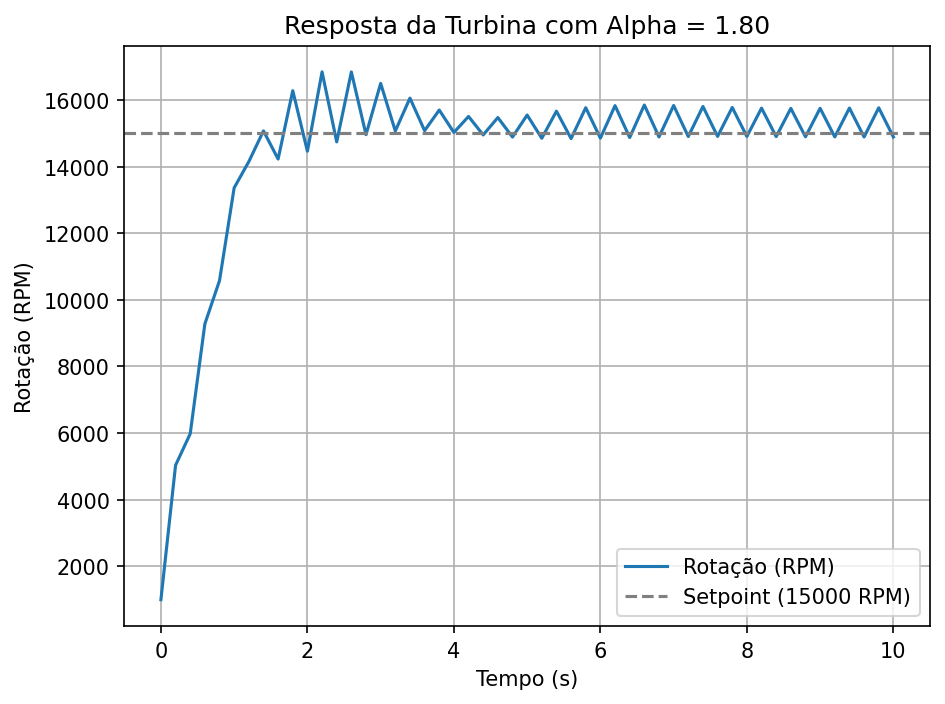

Simulação concluída!


In [132]:
def simular_turbina_alpha180():
    """
    Simula e plota o comportamento da turbina com alpha = 1.80.
    """
    alpha = 1.80
    n_steps = 50
    t_step = 0.2

    # Obter modelos
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais
    x0 = np.array([0.0, 1000.0])  # theta, N
    u_prev = np.array([0.00042])  # vazão inicial

    # Histórico de tempo, rotação e vazão
    time_array = np.arange(0, (n_steps + 1) * t_step, t_step)
    N_array = [1000.0]
    m_comb_array = [u_prev[0]]

    # Simulação
    for _ in range(n_steps):
        u0 = mpc.make_step(x0)
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_prev = u_suavizado.copy()
        x0 = simulator.make_step(u_suavizado)
        x0 = estimator.make_step(x0)

        m_comb_array.append(float(u_suavizado[0]))
        N_array.append(float(x0[1]))

    N_array = np.array(N_array)
    m_comb_array = np.array(m_comb_array)

    # === Salvar Excel ===
    df = pd.DataFrame({
        'Tempo (s)': time_array,
        'Vazão de Combustível (kg/s)': m_comb_array,
        'Rotação (RPM)': N_array
    })
    df.to_excel('dados_turbina_alpha180.xlsx', index=False)

    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N_array)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (±2% do setpoint)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N_array - N_setpoint) < margem
    tempo_estab = None

    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            # Verifica se a estabilização não ocorre muito próximo do fim
            if len(dentro_da_margem[i:]) >= 10:
                tempo_estab = time_array[i]
            break

    # Ruído (pós-estabilização ou últimos 10 pontos)
    if tempo_estab is not None:
        idx_estab = np.where(time_array >= tempo_estab)[0]
        ruido = np.std(N_array[idx_estab[-20:]]) if len(idx_estab) >= 20 else np.std(N_array[idx_estab])
    else:
        ruido = np.std(N_array[-10:])

    # === Resultados ===
    print("=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    if tempo_estab:
        print(f"Tempo de estabilização (2% do setpoint): {tempo_estab:.2f} s")
    else:
        print("Sistema não estabilizou.")
    print(f"Ruído observado (desvio padrão): {ruido:.2f} RPM")

    # === Gráfico ===
    plt.figure(dpi=150)
    plt.plot(time_array, N_array, label='Rotação (RPM)')
    plt.axhline(N_setpoint, color='gray', linestyle='--', label='Setpoint (15000 RPM)')
    if tempo_estab is not None:
        plt.axvline(tempo_estab, color='green', linestyle=':', label='Estabilização')
    plt.xlabel("Tempo (s)")
    plt.ylabel("Rotação (RPM)")
    plt.title("Resposta da Turbina com Alpha = 1.80")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig("resposta_turbina_alpha180.png")

    return time_array, m_comb_array, N_array

def main():
    simular_turbina_alpha180()
    plt.show()
    print("Simulação concluída!")

if __name__ == "__main__":
    main()

In [133]:
df180 = pd.read_excel('dados_turbina_alpha180.xlsx')
print(df180.tail())

    Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)
46        9.2                    -0.000492   14889.502952
47        9.4                     0.001565   15755.899803
48        9.6                    -0.000502   14887.954829
49        9.8                     0.001577   15764.040969
50       10.0                    -0.000511   14888.146228


In [134]:
df180['Emissões NOx (g/s)'] = df180['Vazão de Combustível (kg/s)'] * EInox_num
df180.to_excel('dados_turbina_emissoesalpha180.xlsx', index=False)

In [135]:
df180 = pd.read_excel('dados_turbina_emissoesalpha180.xlsx')
print(df180.head())

   Tempo (s)  Vazão de Combustível (kg/s)  Rotação (RPM)  Emissões NOx (g/s)
0        0.0                     0.000420    1000.000000            0.001140
1        0.2                     0.004914    5034.590931            0.013335
2        0.4                     0.001319    5980.428865            0.003579
3        0.6                     0.004195    9277.350829            0.011384
4        0.8                     0.001894   10576.932836            0.005140


In [136]:
df180['Tempo (s)'] = pd.to_numeric(df180['Tempo (s)'], errors='coerce')

total_nox180 = np.trapz(df180['Emissões NOx (g/s)'], x=df180['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_nox180:.6f} g")

Emissões totais de NOx (trapézio): 0.022955 g


 ### Emissões Reais

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     1202
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      150

Total number of variables............................:      458
                     variables with only lower bounds:        0
                variables with lower and upper bounds:       50
                     variables with only upper bounds:        0
Total number of equality constraints.................:      402
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  9.9960000e+09 3.41e+09 2.80e-03  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\278188512.py:71: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  u_suavizado = float(u_suavizado)


   1  4.9101000e+08 1.04e+11 3.05e+05  -1.0 1.07e+11  -4.0 1.00e+00 2.86e-02f  1
   2  4.9093084e+08 1.04e+11 4.21e+05  -1.0 1.04e+11  -4.5 3.02e-02 2.94e-04f  1
   3r 4.9093084e+08 1.04e+11 9.99e+02  11.0 0.00e+00  -5.0 0.00e+00 1.84e-07R  5
   4r 4.9092965e+08 1.04e+11 9.58e+08  11.0 1.07e+17    -  6.04e-06 5.09e-12f  1
   5r 3.1855568e+08 2.21e+11 2.92e+08   4.7 1.43e+13    -  8.40e-01 7.19e-03f  1
   6  3.1857645e+08 2.20e+11 5.00e+03  -1.0 6.62e+10  -5.4 1.00e+00 2.00e-03h  1
   7  3.1857666e+08 2.20e+11 5.84e+07  -1.0 6.60e+10  -5.9 2.34e-01 2.01e-05h  1
   8r 3.1857666e+08 2.20e+11 1.00e+03   9.0 0.00e+00  -6.4 0.00e+00 1.00e-07R  2
   9r 3.1872240e+08 2.08e+11 1.65e+08   9.0 7.57e+16    -  2.35e-05 2.52e-09f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10r 3.1898240e+08 2.10e+11 1.65e+08   3.4 1.03e+12    -  7.02e-02 1.24e-03f  1
  11  3.2064206e+08 1.71e+11 2.71e+03  -1.0 6.67e+10  -6.9 1.00e+00 1.85e-01h  1
  12  3.2065918e+08 1.71e+11

C:\Users\Usuario\AppData\Local\Temp\ipykernel_8736\278188512.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


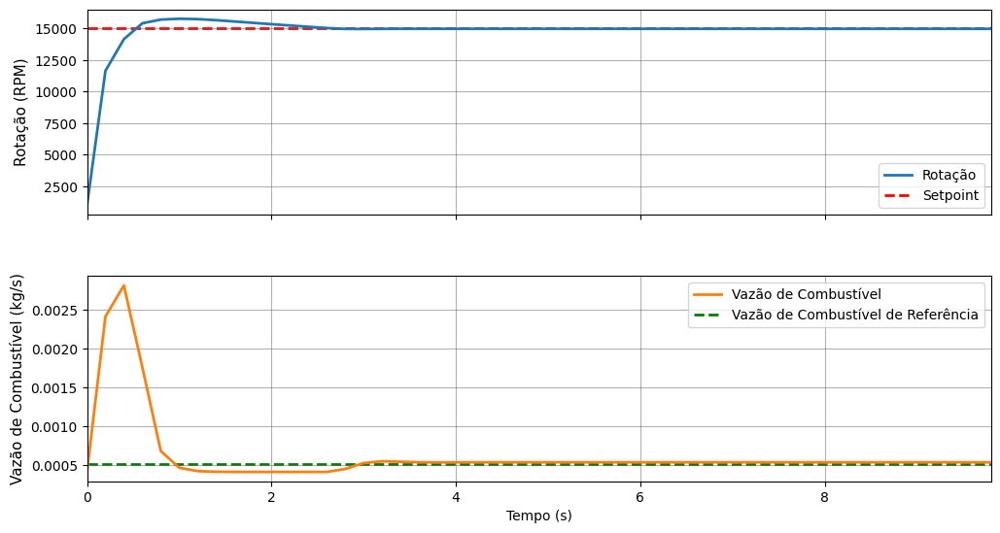

<Figure size 640x480 with 0 Axes>


=== Resultados da Simulação ===
Rotação máxima (overshoot): 15782.87 RPM
Overshoot: 5.22%
Tempo de estabilização: 2.20 s
Ruído observado: 0.33 RPM


In [137]:
def simular_turbina_mpc_rk4_nox(arq_ent = 'dados_turbina_080.xlsx', n_steps=50, h=0.2, alpha=0.8):

    # Leitura e pré-processamento de dados do controlador
    data = pd.read_excel(arq_ent)
    data["Tempo (s)"] = data["Tempo (s)"].astype(str).str.replace("[", "").str.replace("]", "").astype(float) #Manipulando a coluna do tempo para tranformar em formato float
    tempo = data["Tempo (s)"].values
    m_comb = data['Vazão de Combustível (kg/s)'].values
    m_ar = data['Vazão de Ar (kg/s)'].values
    N_simulador = data['Rotação (RPM)'].values

    # Criando funções de interpolação
    m_comb_interp = interp1d(tempo, m_comb, kind='cubic', fill_value='extrapolate')
    m_ar_interp = interp1d(tempo, m_ar, kind='cubic', fill_value='extrapolate')

    # Parâmetros da turbina
    I = 0.063085                 
    eta_cc = 0.98              
    PCI = 4.28e7              
    cp = 1004.0              
    T_entrada = 298.15        
    T_saida = 373.482163

    # Equação diferencial da rotação (dN/dt)
    def dNdt(t, N, u):  
        m_comb_t = u             # O controle agr vem do MPC
        m_ar_t = m_ar_interp(t)  # Interpolação para descobrir a vazão de ar

        W_t = eta_cc * m_comb_t * PCI
        W_c = m_ar_t * cp * (T_saida - T_entrada)

        return (1/I) * ((np.pi/30)**(-2)) * ((W_t - W_c) / N)

    # Função para executar um passao de Runge-Kutta de 4ª ordem
    def runge_kutta_step(N, u, t, h): 
        k1 = dNdt(t, N, u)
        k2 = dNdt(t + h/2, N + h*k1/2, u)
        k3 = dNdt(t + h/2, N + h*k2/2, u)
        k4 = dNdt(t + h, N + h*k3, u)
        
        return N + (h/6) * (k1 + 2*k2 + 2*k3 + k4)
    
    # Array para armazenar os dados refetentes ao tempo, rotação e vazões de combustível e ar
    T = np.zeros(n_steps)
    N = np.zeros(n_steps)
    m_comb_hist = np.zeros(n_steps)
    m_ar_hist = np.zeros(n_steps)

    # Condições iniciais
    T[0] = tempo[0]
    N[0] = N_simulador[0]
    u_prev = m_comb_interp(T[0])
    m_comb_hist[0] = u_prev        
    m_ar_hist[0] = m_ar_interp(T[0])  
    
    # Pegando o objeto mpc criado foi instanciado anteriomente
    mpc, simulator, estimator = TG_mpc_model()

    # Condições iniciais para o loop
    x0 = np.array([0.0, 1000.0]) 
    u_prev = np.array([0.00042])

    for i in range(1, n_steps):
        t = T[i - 1]                   # Tempo atual
        x0 = np.array([0, N[i-1]])     # Estado atual ajustado para o MPC

        # Passo 1: MPC calcula a vazão de combustível 
        u0 = mpc.make_step(x0)   # ação de controle ótima

        # Passo 2: Suavização do sinal de controle
        u_suavizado = alpha * u0 + (1 - alpha) * u_prev
        u_suavizado = float(u_suavizado) 
        u_prev = u_suavizado

        # Passo 3: Atualização da rotação via RK4
        N[i] = runge_kutta_step(N[i-1], u_suavizado, t, h)
        T[i] = t + h            # Avança o tempo no passo h

        # Armazena o histórico das vazões
        m_comb_hist[i] = u_suavizado
        m_ar_hist[i] = m_ar_interp(T[i])

    # Plotando os gráficos com formatação aprimorada
    fig, ax = plt.subplots(2, 1, figsize=(12, 6), sharex=True, gridspec_kw={'hspace': 0.3})

    # Grid e limites
    for a in ax:
        a.grid(True, alpha=0.5, linestyle='-', color='#666665')
        a.set_xlim(0, T[-1])  # ou defina manualmente, ex: a.set_xlim(0, 10)

    # --- Gráfico 1: Rotação ---
    ax[0].plot(T, N, label='Rotação', color='#1f77b4', linewidth=2)
    ax[0].axhline(15000, color='red', linestyle='--', linewidth=2, zorder=1, label='Setpoint')
    ax[0].set_ylabel('Rotação (RPM)', fontsize=11)
    ax[0].tick_params(labelsize=10)
    ax[0].legend(loc='lower right', fontsize=10)

    # --- Gráfico 2: Vazão de Combustível ---
    ax[1].plot(T, m_comb_hist, label='Vazão de Combustível', color='#ff7f0e', linewidth=2)
    ax[1].axhline(0.0005238, color='green', linestyle='--', linewidth=2, zorder=1, label='Vazão de Combustível de Referência')
    ax[1].set_ylabel('Vazão de Combustível (kg/s)', fontsize=11)
    ax[1].set_xlabel('Tempo (s)', fontsize=10)
    ax[1].tick_params(labelsize=10)
    ax[1].legend(loc='upper right', fontsize=10)

    # Ajustes finais
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    fig.savefig('resposta_turbina_malhafec.png', dpi=300, bbox_inches='tight')
    plt.show()

    for a in ax:
        a.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()

    # 🔄 Exportando os resultados
    df_resultado = pd.DataFrame({
        'Tempo (s)': T,
        'Rotação (RPM)': N,
        'Vazão de Combustível (kg/s)': m_comb_hist,
        'Vazão de Ar (kg/s)': m_ar_hist,
    })

    df_resultado.to_excel('resultados_simulacao_malha_fechada_nox.xlsx', index=False)
    
    # === Análise de desempenho ===
    N_setpoint = 15000

    # Overshoot
    max_rpm = np.max(N)
    overshoot_percent = ((max_rpm - N_setpoint) / N_setpoint) * 100 if max_rpm > N_setpoint else 0.0

    # Tempo de estabilização (2% de margem)
    margem = 0.02 * N_setpoint
    dentro_da_margem = np.abs(N - N_setpoint) < margem

    tempo_estab = None
    for i in range(len(dentro_da_margem)):
        if np.all(dentro_da_margem[i:]):
            tempo_estab = T[i]
            break

    # Ruído em regime permanente (últimos 20 pontos após estabilização)
    if tempo_estab is not None:
        idx_estab = np.where(T >= tempo_estab)[0]
        if len(idx_estab) >= 20:
            ruido = np.std(N[idx_estab[-20:]])
        else:
            ruido = np.std(N[idx_estab])
    else:
        ruido = np.std(N[-10:])  # Se não estabilizar, usa últimos 10 pontos

    # Mostrar resultados
    print("\n=== Resultados da Simulação ===")
    print(f"Rotação máxima (overshoot): {max_rpm:.2f} RPM")
    print(f"Overshoot: {overshoot_percent:.2f}%")
    print(f"Tempo de estabilização: {tempo_estab:.2f} s" if tempo_estab else "Sistema não estabilizou.")
    print(f"Ruído observado: {ruido:.2f} RPM")

    return T, N, m_comb_hist, m_ar_hist

if __name__ == "__main__":
    simular_turbina_mpc_rk4_nox()

In [138]:
df_nox = pd.read_excel('resultados_simulacao_malha_fechada_nox.xlsx')
print(df_nox.head())

   Tempo (s)  Rotação (RPM)  Vazão de Combustível (kg/s)  Vazão de Ar (kg/s)
0        0.0    1000.000000                     0.000420            0.020000
1        0.2   11659.723046                     0.002417            0.059403
2        0.4   14166.668492                     0.002817            0.104279
3        0.6   15424.507335                     0.001763            0.149188
4        0.8   15718.249587                     0.000686            0.193070


In [139]:
df_nox['Emissões NOx (g/s)'] = df_nox['Vazão de Combustível (kg/s)'] * EInox_num
df_nox.to_excel('dados_turbina_emissoesalphanox.xlsx', index=False)

In [140]:
df_nox = pd.read_excel('dados_turbina_emissoesalphanox.xlsx')
print(df_nox.tail())

    Tempo (s)  Rotação (RPM)  Vazão de Combustível (kg/s)  Vazão de Ar (kg/s)  \
45        9.0   14984.740946                     0.000541            0.300023   
46        9.2   14984.694445                     0.000541            0.300023   
47        9.4   14984.648748                     0.000541            0.300023   
48        9.6   14984.604346                     0.000541            0.300023   
49        9.8   14984.561450                     0.000541            0.300022   

    Emissões NOx (g/s)  
45            0.001468  
46            0.001468  
47            0.001468  
48            0.001468  
49            0.001468  


In [141]:
df_nox['Tempo (s)'] = pd.to_numeric(df_nox['Tempo (s)'], errors='coerce')

total_noxreal = np.trapz(df_nox['Emissões NOx (g/s)'], x=df_nox['Tempo (s)'])
print(f"Emissões totais de NOx (trapézio): {total_noxreal:.6f} g")

Emissões totais de NOx (trapézio): 0.016737 g


---

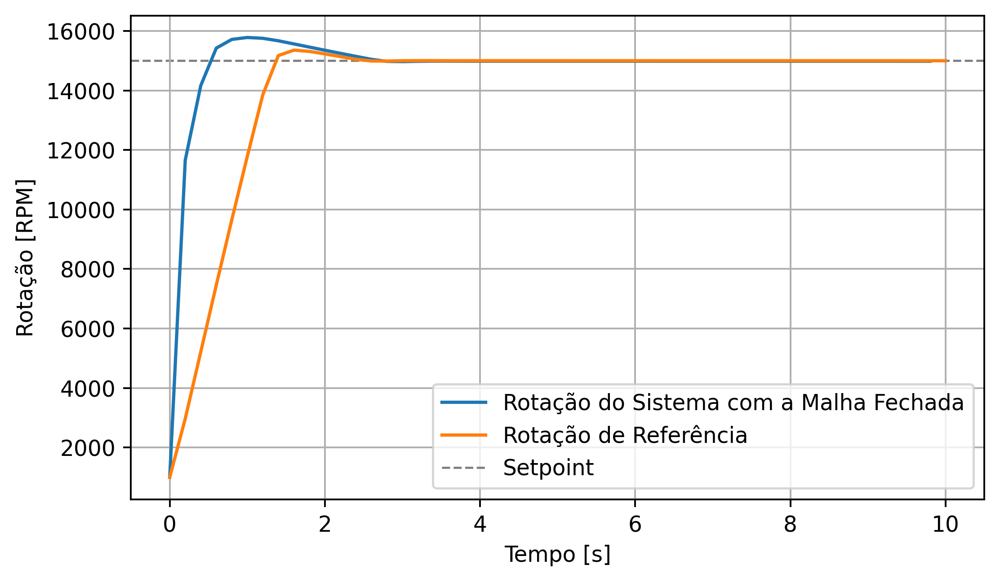

In [142]:
# Pegando os dados do sistema em malha fechada
tempo_nox = df_nox['Tempo (s)'].values
N_nox = df_nox['Rotação (RPM)'].values

# Pegando os dados do controlador 
tempo_080 = df080["Tempo (s)"].astype(str).str.replace("[", "").str.replace("]", "").astype(float).values
N_080 = df080['Rotação (RPM)'].values

noxx = df_nox['Emissões NOx (g/s)'].values
noxx_080 = df080['Emissões NOx (g/s)'].values

plt.figure(figsize=(7.0, 4.0), dpi=350)
plt.plot(tempo_nox, N_nox, label='Rotação do Sistema com a Malha Fechada')
plt.plot(tempo_080, N_080, label = 'Rotação de Referência')
plt.axhline(15000, color='grey', linestyle='--', linewidth=1, zorder=1, label='Setpoint')
plt.legend()
plt.grid(True)
plt.xlabel('Tempo [s]')
plt.ylabel('Rotação [RPM]')
plt.savefig('comparação_rotações.png', format='png')
plt.show()

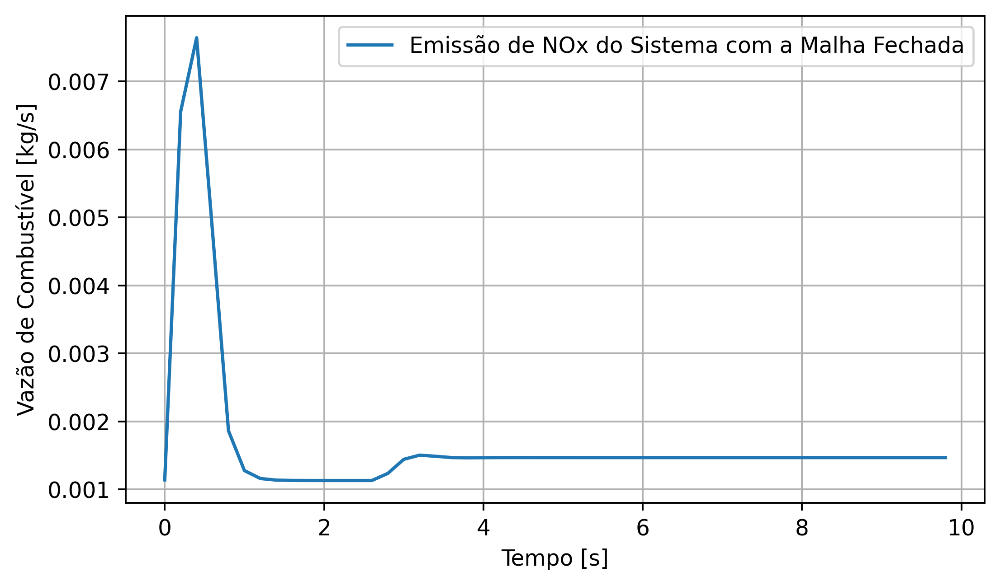

In [143]:
plt.figure(figsize=(7, 4.0), dpi=350)

plt.plot(tempo_nox, noxx, label='Emissão de NOx do Sistema com a Malha Fechada')
#plt.plot(tempo_080, noxx_080, label = 'Emissão de NOx de Referência')
plt.legend()
plt.grid(True)
plt.xlabel('Tempo [s]')
plt.ylabel('Vazão de Combustível [kg/s]')
plt.savefig('emissoesnox.png', format='png')
plt.show()

---

In [144]:
dic_noxx = {
    'alpha':[0.20, 0.40, 0.60, 0.70, 0.80, 0.90, 1.00, 1.2, 1.4, 1.6, 1.8],
    'Emissão de NOx':[0.024256, 0.022738,  0.022485, 0.022441, 0.022436,  0.022447, 0.022464, 0.022495, 0.022546, 0.022694,0.023048 ]
}

df_noxx = pd.DataFrame(dic_noxx)
print(df_noxx)

    alpha  Emissão de NOx
0     0.2        0.024256
1     0.4        0.022738
2     0.6        0.022485
3     0.7        0.022441
4     0.8        0.022436
5     0.9        0.022447
6     1.0        0.022464
7     1.2        0.022495
8     1.4        0.022546
9     1.6        0.022694
10    1.8        0.023048


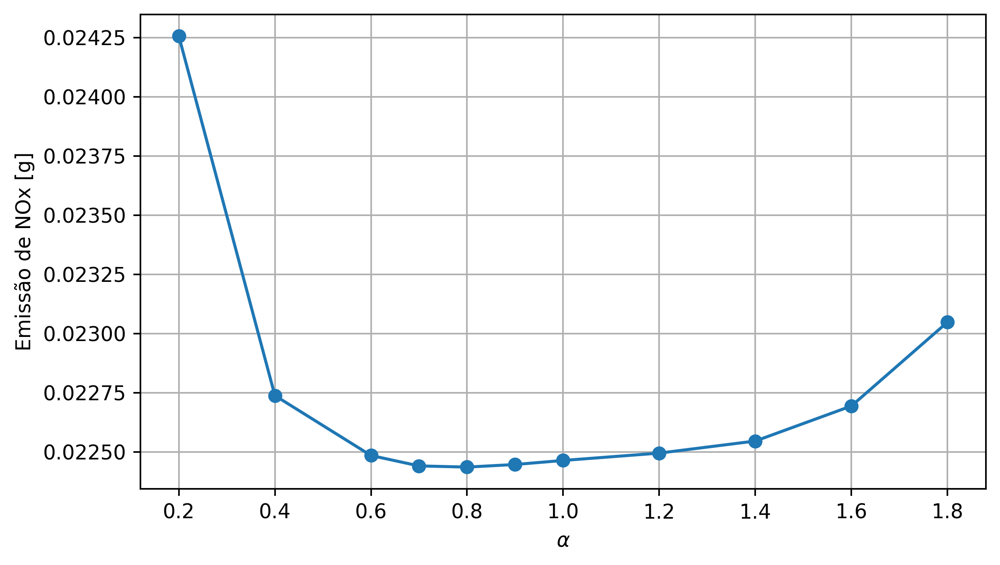

In [145]:
eixo_y = df_noxx['alpha'].values
eixo_x = df_noxx['Emissão de NOx'].values

plt.figure(figsize=(7, 4), dpi=350)
plt.plot(eixo_y, eixo_x, marker='o')
plt.xlabel(r'$\alpha$')
plt.ylabel('Emissão de NOx [g]')
plt.grid(True)
plt.tight_layout()
plt.savefig('emissões_vs_alpha.png', dpi=350, bbox_inches='tight')
plt.show()